## Data Cleaning
Import our libraries first.

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import biosppy
import neurokit2 as nk
import pickle
import pywt

from scipy import signal, fft
from scipy.interpolate import interp1d
from biosppy.signals import ecg, eeg, resp, eda

from tsfresh import select_features
from tsfresh import extract_relevant_features
from tsfresh.feature_extraction import feature_calculators
import tsfresh

from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.pipeline import Pipeline as imbpipe

In [2]:
mpl.rcParams['figure.figsize'] = [8.0, 6.0]
mpl.rcParams['font.size'] = 15
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

### Problem Statement

In aviation, operational safety is of paramount importance. For any activity in aviation you can think of, there probably exists a safety manual for it. Maintaining the highest levels of safety requires everyone to constantly be at the top of their game. However, it is also a fact that air crew are only human, and sometimes, fatigue and long hours of work could cause unintentional lapses in safety standards. The very unfortunate [2002 Uberlingen mid-air collision](https://www.skybrary.aero/index.php/T154_/_B752,_en-route,_Uberlingen_Germany,_2002) involving 2 aircraft was an example of how a distracted Air Traffic Controller failed to ensure the proper safety standards in maintaining aircraft separation. Pilots, too, are not exempt from such situations. That is why a robust system of having 1-2 extra co-pilots rotating exists, to prevent fatigue from affecting safety standards.

The prompt from the Kaggle competition that this dataset is taken says,
    
    Most flight-related fatalities stem from a loss of “airplane state awareness.” That is, ineffective attention management on the part of pilots who may be distracted, sleepy or in other dangerous cognitive states.

Thus, in this project, we will aim to build a classifier that can detect undesirable attentional states of pilots, so that they can be warned when they unaware that they are slipping into these states. This classifier is intended to be operationally functional, in that it should work in real-time and real conditions, rather than something that is used post-hoc to analyze an experiment. 

We will explore 2 approaches to building such a classifier. 

1. Aggregate features from signals
    - From a given length of signal, we extract and engineer scalar features that can be used to represent the signal as a whole.
    - We will train boosted tree models on these aggregate features.
    - Pros:
        - Once data processing is done, the amount of data needed to be fed into the classifier to produce predictions is very small.
    - Cons:
        - Data processing may be extensive.
2. Raw signals
    - We will directly feed raw signals into a deep learning model.
    - Pros:
        - Requires minimal data preprocessing, so more suitable for on-the-spot classification in operational context
    - Cons:
        - Data intensive

### Load data

In [3]:
df = pd.read_csv('./data/train.csv')

In [5]:
df.head()

,crew,experiment,time,seat,eeg_fp1,eeg_f7,eeg_f8,eeg_t4,eeg_t6,eeg_t5,...,eeg_c4,eeg_p4,eeg_poz,eeg_c3,eeg_cz,eeg_o2,ecg,r,gsr,event
0,1,CA,0.011719,1,-5.28545,26.775801,-9.527310,-12.793200,16.717800,33.737499,...,37.368999,17.437599,19.201900,20.5968,-3.95115,14.507600,-4520.0,817.705994,388.829987,A
1,1,CA,0.015625,1,-2.42842,28.430901,-9.323510,-3.757230,15.969300,30.443600,...,31.170799,19.399700,19.689501,21.3547,1.33212,17.750200,-4520.0,817.705994,388.829987,A
2,1,CA,0.019531,1,10.67150,30.420200,15.350700,24.724001,16.143101,32.142799,...,-12.012600,19.396299,23.171700,22.4076,1.53786,22.247000,-4520.0,817.705994,388.829987,A
3,1,CA,0.023438,1,11.45250,25.609800,2.433080,12.412500,20.533300,31.494101,...,18.574100,23.156401,22.641199,19.3367,2.54492,18.998600,-4520.0,817.705994,388.829987,A
4,1,CA,0.027344,1,7.28321,25.942600,0.113564,5.748000,19.833599,28.753599,...,6.555440,22.754700,22.670300,20.2932,1.69962,22.812799,-4520.0,817.705994,388.829987,A


In [6]:
df.columns

Index(['crew', 'experiment', 'time', 'seat', 'eeg_fp1', 'eeg_f7', 'eeg_f8',
       'eeg_t4', 'eeg_t6', 'eeg_t5', 'eeg_t3', 'eeg_fp2', 'eeg_o1', 'eeg_p3',
       'eeg_pz', 'eeg_f3', 'eeg_fz', 'eeg_f4', 'eeg_c4', 'eeg_p4', 'eeg_poz',
       'eeg_c3', 'eeg_cz', 'eeg_o2', 'ecg', 'r', 'gsr', 'event'],
      dtype='object')

From the Kaggle data description, this is what we know of our data. All signals are sampled at 256Hz

1. Crew
    - comprised of 2 pilots
2. Seat
    - 0 or 1, denoting which seat the pilot from a given crew is sitting on.
3. Experiment
    - 3 types of experiments
    - Channeled Attention (CA)
        - Pilot is asked to focus on a puzzle solving video game
    - Distracted Attention (CA)
        - Pilot is asked to do a 'monitoring' task and is periodically disturbed by being asked to quickly a maths question before resuming the monitoring task
    - Startled/Surprised (SS)
        - Pilot is asked to watch movie clips with Jump scares. This is possibly the least realistic experiment
4. Event
    - 4 types of events
    - A
        - 'Baseline state' for DA and SS experiments when the event in question is not happening.
        - Somewhat misleading, because the baseline states for DA and SS are not the same
    - B
        - Startled/Surprised.
        - Jumpscares
        - 1 or 2 of such events per SS experiment
    - C 
        - Channeled Attention. This state is constant throughout all CA experiments
    - D
        - Distracted Attention. Event where pilot has to quickly switch tasks and complete the distraction task
5. ECG
    - 3-lead ECG recording, combined into 1 channel. 
    - Not the best representation for an ECG signal
6. 20 separate EEG channels
    - each channel is its own lead, so it is purer than the ECG signal
7. R, respiration
    - measure of rise and fall of the chest
8. GSR, galvanic skin response
    - measure of electrodermal activity.
    


### Create a unique ID for each pilot
Before looking at our signals, let's give each pilot a unique ID based on his Crew and Seat.

In [9]:
df['pilot'] = df['crew'] * 100 + df['seat']
df['pilot'] = df['pilot'].map(lambda x: 'p'+ str(x))

In [5]:
df['pilot'].unique()

array(['p101', 'p100', 'p200', 'p201', 'p300', 'p301', 'p400', 'p401',
       'p501', 'p500', 'p600', 'p601', 'p701', 'p700', 'p800', 'p801',
       'p1300', 'p1301'], dtype=object)

## EDA

Before looking at our signals, let's just very quickly take a look at the class balance for our target variable `event`.

In [21]:
df['event'].value_counts(normalize=True)

A    0.585281
C    0.339540
D    0.048348
B    0.026831
Name: event, dtype: float64

Our classes of interest here would mostly be the 'negative' events, which are the Distracted Attention and Surprised/Startled events. These events are represented by D and B respectively. We see that combined, our minority classes make up just over 7% of the data, so this is quite an imbalanced dataset. This will probably mean we might want to try out some resampling techniques later.


### Examining the different events
One way to better understand our events is to visualize their occurance during each experiment.

In [4]:
def plot_ecg(crew, seat,df=df):
    
    fig, ax = plt.subplots(2,3, figsize=(15,12))
    for n,exp in enumerate(['CA','DA','SS']):
        tmp = df[(df['crew']==crew)& (df['experiment']==exp) & (df['seat']==seat)] 
        tmp = tmp.sort_values(by='time')
        ax[0,n].plot(tmp['time'], tmp['ecg'])
        ax[0,n].set_title(f'ECG graph for event {exp}')
        ax[0,n].set_ylabel('ECG readings (microvolts)')
        ax[0,n].set_xlabel('Time (s)')
        events = tmp['event'].map({'A':0,
                              'B':1,
                              'C':2,
                              'D':3})
        ax[1,n].plot(tmp['time'],events)

        ax[1,n].set_xlabel('Time (s)')
        ax[1,n].set_ylabel('Event')
        ax[1,n].set_title(f'Event type: {exp}')
    plt.suptitle(f'Crew {crew}, seat {seat}')
    plt.tight_layout()

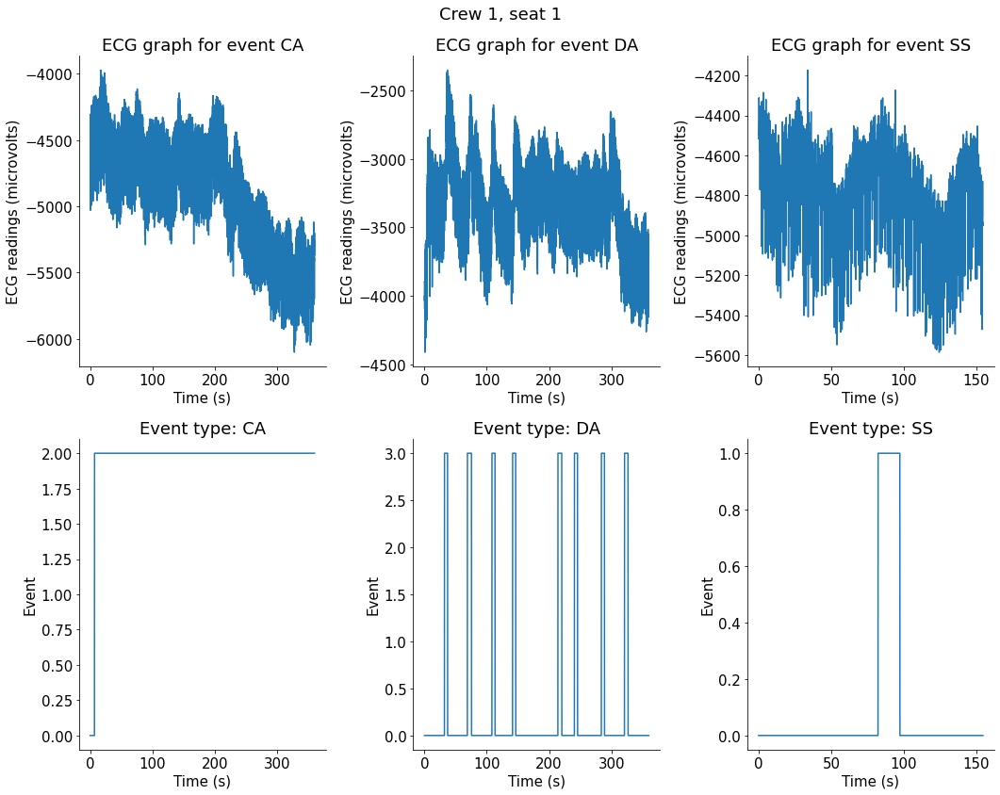

In [5]:
plot_ecg(1,1)

In [31]:
# there are 8 DA events
df[(df['pilot']=='p101') & (df['event']=='D')]

,crew,experiment,time,seat,eeg_fp1,eeg_f7,eeg_f8,eeg_t4,eeg_t6,eeg_t5,...,eeg_p4,eeg_poz,eeg_c3,eeg_cz,eeg_o2,ecg,r,gsr,event,pilot
190010,1,DA,108.246094,1,14.482400,15.760100,31.115499,37.891102,39.302200,47.419800,...,32.793701,33.558399,22.176100,-185.791000,36.971199,-3122.729980,816.000977,397.618011,D,p101
190012,1,DA,108.250000,1,8.970250,10.563800,16.994101,29.523701,36.646702,46.823898,...,32.568901,33.582802,17.881701,-189.559006,37.004501,-3122.729980,816.000977,397.618011,D,p101
190014,1,DA,108.253906,1,14.551400,20.202000,19.595600,32.458500,43.279800,56.796501,...,38.786800,36.726200,24.940201,-186.608002,34.791599,-3122.729980,816.000977,397.618011,D,p101
190016,1,DA,108.257812,1,19.759899,17.779800,33.182098,42.596802,46.322701,58.906200,...,40.792198,41.430599,36.045101,-186.104004,36.542301,-3122.729980,816.000977,397.618011,D,p101
190018,1,DA,108.261719,1,29.282200,14.030000,37.894901,42.062500,45.703899,64.840500,...,45.756500,51.649101,46.524399,-187.871002,47.060398,-3122.729980,816.000977,397.618011,D,p101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354905,1,DA,75.433594,1,124.745003,38.401299,87.979103,27.497801,5.773240,10.415600,...,12.391000,18.299801,24.181900,46.539902,7.415610,-2609.129883,816.229004,352.597992,D,p101
354907,1,DA,75.437500,1,127.522003,40.775398,89.106697,28.092501,10.288000,6.298440,...,15.475200,18.399799,15.892900,50.791199,11.003500,-2609.129883,816.229004,352.597992,D,p101
354909,1,DA,75.441406,1,138.535995,33.436600,92.793999,24.541100,18.071100,2.489760,...,17.166500,20.754801,19.657101,55.259201,12.822900,-2609.129883,816.229004,352.597992,D,p101
354911,1,DA,75.445312,1,152.214996,43.113602,108.948997,29.711599,17.534100,12.422700,...,18.216299,23.858299,30.807899,57.125702,12.245600,-2676.889893,816.239014,352.528015,D,p101


In [16]:
# average length of each DA event, there are 8 events, and our sampling rate is 256 Hz
print('Average length of DA event for pilot 100: {}s'\
      .format(df[(df['pilot']=='p101') & (df['event']=='D')].shape[0]/8/256))

Average length of DA event for pilot 100: 5.44189453125s


In [19]:
# there is 1 SS event
df[(df['pilot']=='p101') & (df['event']=='B')]

,crew,experiment,time,seat,eeg_fp1,eeg_f7,eeg_f8,eeg_t4,eeg_t6,eeg_t5,...,eeg_p4,eeg_poz,eeg_c3,eeg_cz,eeg_o2,ecg,r,gsr,event,pilot
438077,1,SS,82.296875,1,-24.307501,-23.211300,1.224060,5.361320,-5.830510,1.199930,...,-3.62554,-2.056350,-9.673040,36.751301,3.287350,-4642.180176,819.875977,528.112000,B,p101
438079,1,SS,82.300781,1,-29.770800,-28.936899,-9.094360,1.067650,-0.486537,1.732170,...,-1.70614,-1.713380,-9.508470,40.256500,8.576400,-4642.180176,819.875977,528.112000,B,p101
438081,1,SS,82.304688,1,-12.038000,-7.898610,-2.100070,-1.212890,-6.564180,1.292150,...,-10.05580,-11.848600,-8.471760,44.409199,-7.578860,-4642.180176,819.875977,528.112000,B,p101
438083,1,SS,82.308594,1,0.000000,5.635210,2.511530,-2.217390,-12.923200,4.708330,...,-12.57620,-10.129200,-6.004460,48.880699,-8.411410,-4642.180176,819.875977,528.112000,B,p101
438085,1,SS,82.312500,1,4.886160,9.852020,-1.733270,-6.304240,-10.799200,0.708543,...,-7.97047,-6.892060,-3.185460,52.554600,1.491050,-4642.180176,819.875977,528.112000,B,p101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446283,1,SS,97.324219,1,55.587399,54.864300,-35.668999,-27.590700,-11.745800,29.878599,...,-6.85254,0.532574,17.675301,172.546997,-11.287500,-4763.180176,817.179016,483.955994,B,p101
446285,1,SS,97.328125,1,51.252899,53.436901,-33.257900,-17.823400,-12.221100,23.392599,...,-6.85144,-3.687250,15.189200,170.132996,-14.263500,-4763.180176,817.179016,483.955994,B,p101
446287,1,SS,97.332031,1,57.319801,53.971199,-25.782700,-17.350201,-14.759800,23.113100,...,-8.60051,-5.647450,17.069700,172.235001,-16.010599,-4763.180176,817.179016,483.955994,B,p101
446289,1,SS,97.335938,1,58.986801,59.432400,-30.264700,-26.938200,-10.270600,24.765600,...,-6.95598,-3.721110,21.056299,174.399002,-9.223130,-4763.180176,817.179016,483.955994,B,p101


In [20]:
# length of SS event
print('Average length of SS event for pilot 100: {}s'\
      .format(df[(df['pilot']=='p101') & (df['event']=='B')].shape[0]/256))

Average length of SS event for pilot 100: 15.046875s


We see that the Channelled Attention event lasts for the entire duration of the Channelled Attention experiment. For the DA experiment, there are multiple short DA events that occur throughout the experiment, with each event lasting around 5s. In contrast, the SS experiment has only 1 SS event happening during the experiment, but the event lasts longer than the DA event, around 15s. We'll take a look at a few other pilots to see whether this holds true.

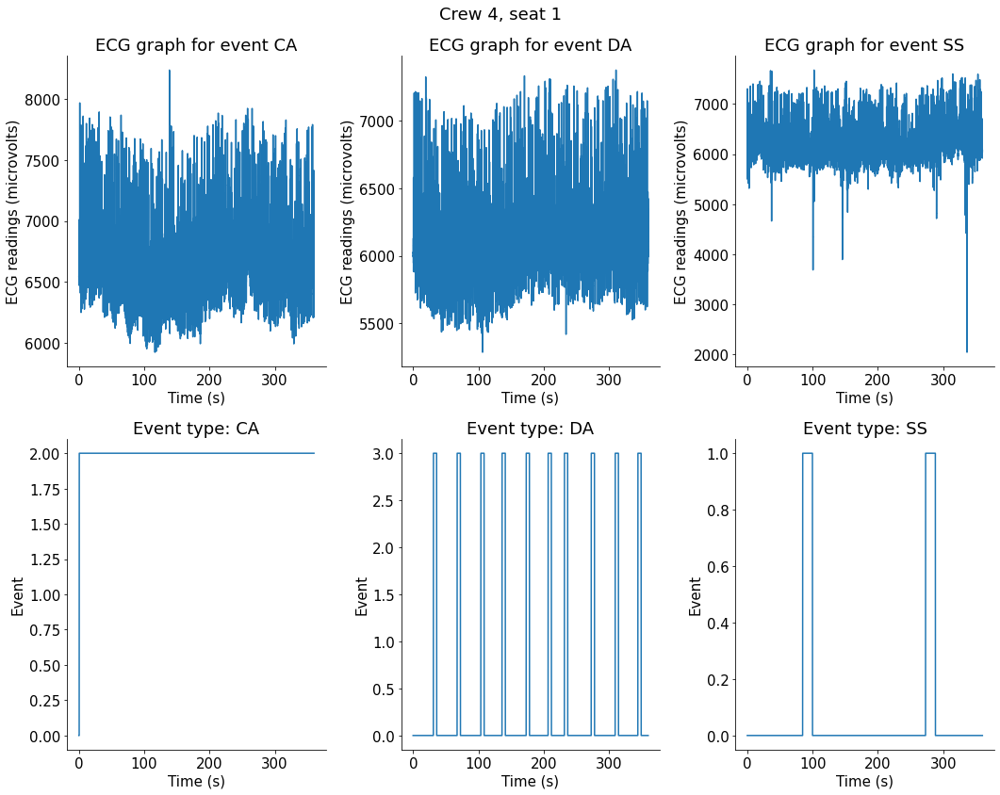

In [23]:
plot_ecg(4,1)

In [24]:
# average length of each DA event, there are 10 events for this pilot
print('Average length of DA event for pilot 100: {}s'\
      .format(df[(df['pilot']=='p401') & (df['event']=='D')].shape[0]/10/256))

Average length of DA event for pilot 100: 5.00390625s


In [26]:
# average length of each SS event, there are 2 events for this pilot
print('Average length of SS event for pilot 100: {}s'\
      .format(df[(df['pilot']=='p401') & (df['event']=='B')].shape[0]/2/256))

Average length of SS event for pilot 100: 14.98046875s


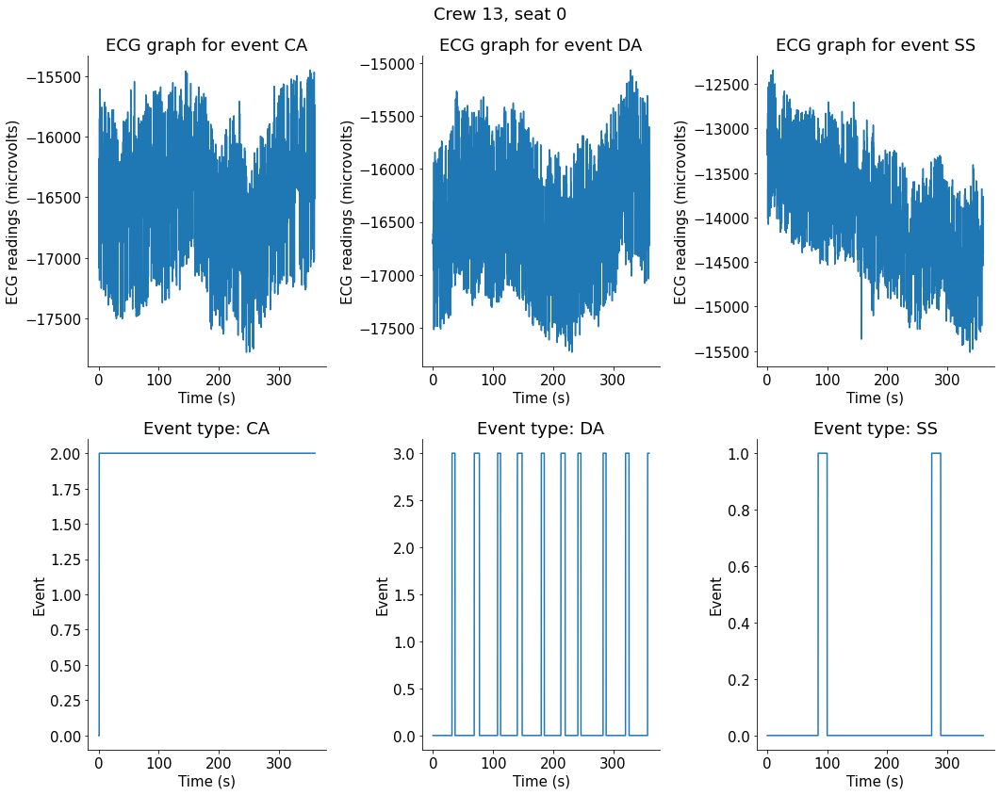

In [27]:
plot_ecg(13,0)

In [28]:
# average length of each DA event, there are 10 events for this pilot
print('Average length of DA event for pilot 100: {}s'\
      .format(df[(df['pilot']=='p1301') & (df['event']=='D')].shape[0]/10/256))

Average length of DA event for pilot 100: 5.494921875s


In [29]:
# average length of each SS event, there are 2 events for this pilot
print('Average length of SS event for pilot 100: {}s'\
      .format(df[(df['pilot']=='p1301') & (df['event']=='B')].shape[0]/2/256))

Average length of SS event for pilot 100: 15.001953125s


It appears that there are betweeen 8-10 DA events per experiment per pilot, and between 1-2 SS events per experiment per pilot. The average length of the events are roughly the same for everyone, with DA events lasting around 5s and SS events lasting 15s.

### ECG
We know that each pilot takes part in all 3 experiments. Let's take a look at the ECG data for one experiment as an example.

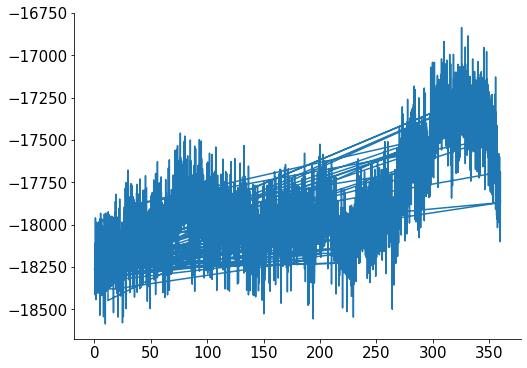

In [5]:
mask = (df['pilot']=='p100') & (df['experiment']=='CA') 
plt.plot(df[mask]['time'], df[mask]['ecg'])

Looking at the many random lines criss crossing our plot, we already know that our data is actually not sorted properly by time. Let's fix this now.

In [6]:
df.sort_values(by=['pilot','experiment','time'], inplace=True)
df.reset_index(drop=True, inplace=True)

Let's check that same experiment again to make sure our time data is properly sorted.

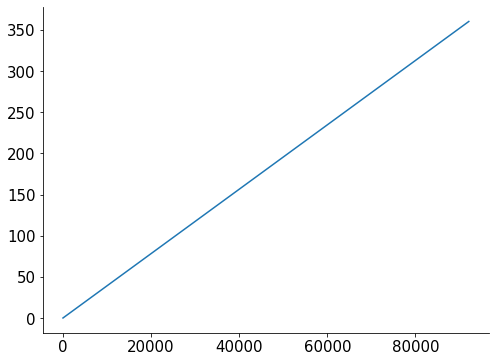

In [7]:
mask = (df['pilot']=='p100') & (df['experiment']=='CA') 
plt.plot(df[mask]['time'])

Now that our time series is back in order, let's look at all the ECG graphs for all experiments.

In [38]:
def plot_feature_all(feature, df=df, start=0, end=-1):
    fig, ax = plt.subplots(nrows=len(df['pilot'].unique()), ncols=3, figsize = (18, 5 * len(df['pilot'].unique())))
    for n, pilot in enumerate(df['pilot'].unique()):
        for m, exp in enumerate(df['experiment'].unique()):
            mask = (df['pilot']==pilot) & (df['experiment']==exp) 
            ax[n,m].plot(df[mask]['time'].iloc[start:end], df[mask][feature].iloc[start:end])
            ax[n,m].set_title('{} experiment {}'.format(pilot, exp))
    plt.tight_layout();

In [10]:
def plot_ecg_all(df=df):
    fig, ax = plt.subplots(nrows=len(df['pilot'].unique()), ncols=3, figsize = (18, 5 * len(df['pilot'].unique())))
    for n, pilot in enumerate(df['pilot'].unique()):
        for m, exp in enumerate(df['experiment'].unique()):
            mask = (df['pilot']==pilot) & (df['experiment']==exp) 
            ax[n,m].plot(df[mask]['time'].iloc[1280:2560], df[mask]['ecg_denoised'].iloc[1280:2560])
            ax[n,m].set_title('{} experiment {}'.format(pilot, exp))
    plt.tight_layout();

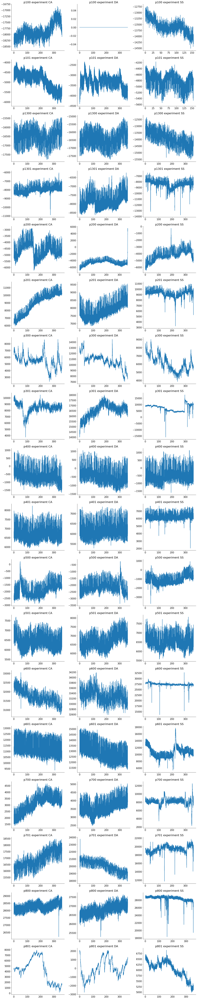

In [39]:
plot_feature_all('ecg')

An immediate observation we can make it that none of these readings are centered around 0. This is an example of a typical ECG recording. 

<img src="./images/baselinedrift.png" style="width: 500px;"/>

Here we notice that ECG recordings are typically centered around 0. The fact that we have ECG recordings with microvolt values of 30000 or -16000 shows us that these readings were not centered beforehand. A second observation is that these readings are constantly jumping all over the place, indicating the presence of the first problem in the visual above - baseline wander, also called baseline drift. Likely, these readings are all messy and dirty due to the fact that these readings were taken from people performing an activity, which can introduce noise especially if these were not done in a 'clinical' setting.

Another thing to note is that for p100's DA experiment, the ECG graphs shows a flat 0. This indicates that mostly the sensors were malfunctioning during that run and they did not bother to restart the experiment to fix it. Unfortunately, this means that this data is Missing At Random, and as such we are unable to use any imputation methods upon it.

We have 2 choices here. 1) Drop the data from p100's DA experiment. This comes with the undesired consequence of reducing our minority classes already, as Distracted Attention events occur for only a few seconds at a time, meaning most of our data is just the baseline state. Losing this data would simply make our dataset even more imbalanced. 2) We can opt to NOT use the ECG data we have, and instead use our other 22 features. If these other features are able to provide us with good results, dropping ECG could be a viable option. Let's just continue exploring our ECG data for now.

Below is a random 10s sample taken 2 pilots, both from the CA experiment.

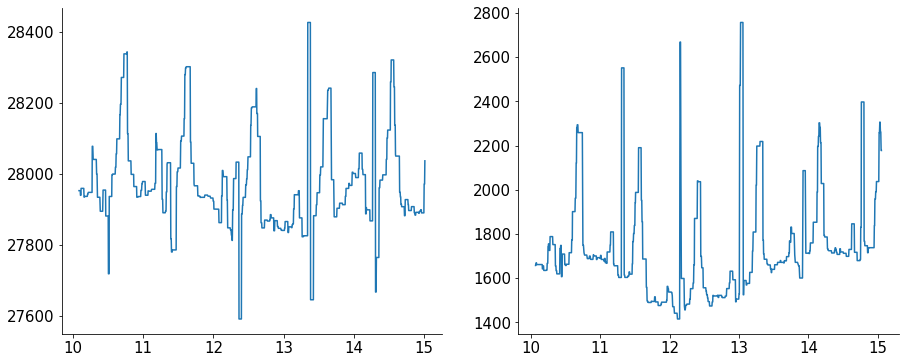

In [17]:
fig, ax = plt.subplots(1,2, figsize=(15,6))
for n, pilot in enumerate(['p800','p700']):
    mask = (df['pilot']==pilot) & (df['experiment']=='CA') 
    signal_sample = df[mask][['time','ecg']].iloc[2560:3840]
    ax[n].plot(signal_sample['time'], signal_sample['ecg'])

From here we can roughly make out the peaks in each waveform, even though the waveforms themselves are not smooth and appear to be very noisy. However, we also note that there are quite a few erroneous peaks that don't coincide properly with what we can visually determine to be the proper peaks of the actual ECG waveform. These are examples of artifacts present in the data that we have to deal with, and can be considered to be different from noise in the signal, which presents as fuzziness or jaggedness in the signal due to high frequency contaminants.

We will be employing 2 libraries to help us solve our 2 problems - baseline drift and noise. For the first task, we use NeuroKit2's ecg_clean function to return to us a 'clean' waveform. The benefit of this clean waveform is primarily the removal of the baseline drift, although it can also help with some of the more severe noise artifacts present. For the second task, we use the pywavelet library to clean our signal through something called the Discrete Waveform Transform. A demonstration of the power of this technique is shown below.
***
The below code for wavelet denoising was taken from a Kaggle notebook at this link:
    https://www.kaggle.com/theoviel/denoising-with-direct-wavelet-transform,
    with added comments on how the code works

In [8]:
def madev(d, axis=None):
    """ Mean absolute deviation of a signal """
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)
def wavelet_denoising(x, wavelet='db4', level=1):
    # extract coefficients for both detailed and approximate levels
    # for level=n, you will get back cDn, cD1, cD2...cDn coefficients.
    coeff = pywt.wavedec(x, wavelet, mode="per")
    # sets universal threshold for the thresholding function
    sigma = (1/0.6745) * madev(coeff[-level])
    uthresh = sigma * np.sqrt(2 * np.log(len(x)))
    # applies the thresholding function only on the detailed coefficients
    coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])
    # recreates the signal using the 'denoised' coefficients.
    return pywt.waverec(coeff, wavelet, mode='per')

([<matplotlib.lines.Line2D at 0x1f0b6483b80>], Text(0.5, 1.0, 'Denoised'))

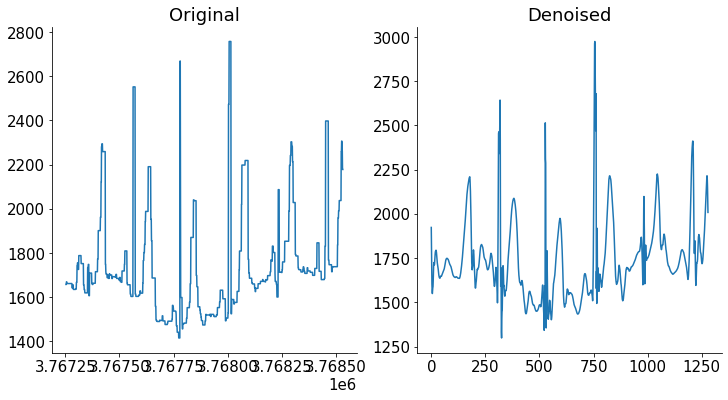

In [18]:
new_signal = wavelet_denoising(signal_sample['ecg'], wavelet='db4', level=3)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
ax1.plot(signal_sample['ecg']), ax1.set_title('Original'),
ax2.plot(new_signal), ax2.set_title('Denoised')

We can observe that our signal now contains significantly less jaggedness. However, we were unable to remove the peaks present in our signal.

Let's remove the baseline drift and noise all at once.

In [9]:
for pilot in df['pilot'].unique():
    for exp in df['experiment'].unique():
        try:
            mask = (df['pilot']==pilot) & (df['experiment']==exp)
            data = nk.ecg_clean(df[mask]['ecg'], sampling_rate=256)
#             print(data[['ECG_Clean']].head())
            print('Extracted clean signal for {} {}'.format(pilot, exp))
        
            new_signal = wavelet_denoising(data, wavelet='sym6', level=2)
            df.loc[mask,'ecg_denoised'] = new_signal[:data.shape[0]]
            print('Denoised clean signal for {} {}'.format(pilot, exp))

            print('Successfully extracted ECG data for {} {}'.format(pilot, exp))
            print('----------')
        except:
            print('Error with processing ECG data for {} {}'.format(pilot, exp))
            print('----------')

Extracted clean signal for p100 CA
Denoised clean signal for p100 CA
Successfully extracted ECG data for p100 CA
----------
Extracted clean signal for p100 DA
Denoised clean signal for p100 DA
Successfully extracted ECG data for p100 DA
----------
Extracted clean signal for p100 SS
Denoised clean signal for p100 SS
Successfully extracted ECG data for p100 SS
----------
Extracted clean signal for p101 CA
Denoised clean signal for p101 CA
Successfully extracted ECG data for p101 CA
----------
Extracted clean signal for p101 DA
Denoised clean signal for p101 DA
Successfully extracted ECG data for p101 DA
----------
Extracted clean signal for p101 SS
Denoised clean signal for p101 SS
Successfully extracted ECG data for p101 SS
----------
Extracted clean signal for p1300 CA
Denoised clean signal for p1300 CA
Successfully extracted ECG data for p1300 CA
----------
Extracted clean signal for p1300 DA
Denoised clean signal for p1300 DA
Successfully extracted ECG data for p1300 DA
----------
Ex

Now we take a look again all the ECG graphs like before, but let's look at a snapshot this time rather than the whole experiment

In [10]:
def plot_ecg_all(df=df):
    fig, ax = plt.subplots(nrows=len(df['pilot'].unique()), ncols=3, figsize = (18, 5 * len(df['pilot'].unique())))
    for n, pilot in enumerate(df['pilot'].unique()):
        for m, exp in enumerate(df['experiment'].unique()):
            mask = (df['pilot']==pilot) & (df['experiment']==exp) 
            ax[n,m].plot(df[mask]['time'].iloc[1280:2560], df[mask]['ecg_denoised'].iloc[1280:2560])
            ax[n,m].set_title('{} experiment {}'.format(pilot, exp))
    plt.tight_layout();

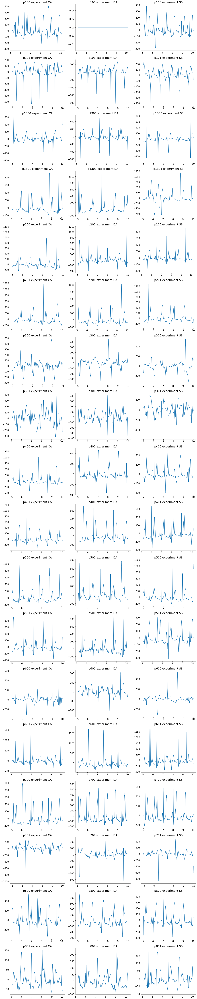

In [53]:
plot_ecg_all()

A quick glance at our data tells us that the quality is already not great. Firstly, Pilot 100's DA experiment shows a flat line, which indicates that the sensors weren't working, hence no signal was picked up. Such missing data is termed Missing At Random, and indicates to us that we are unable to use any methods of imputation. Hence, if we were to choose to use ECG data as a feature, we would need to drop all rows from this experiment. 

Secondly, between different pilots and different experiments, we see that the clarity of the signal recorded varies significantly. Take for instance Pilot 800's DA experiment. We can quite clearly observe 5 equally spaced out peaks, with a couple of extremely narrow spikes that do not line up with the periodicity of the 5 peaks. These spikes are most likely noise artifacts in the data that we were unable to remove, even with our denoising function. Nonetheless, visual inspection allows us to differentiate what is a true peak and what is not. These peaks are called R-peaks in ECG terminology, and the R-R interval, or the interval between 2 successive R peaks, is what we can use to derive heart rate. Unfortunately, due to the noise present in these signals, it can be very hard for a R-peak detection function to properly differentiate a true peak from a noise artifact, and subsequently we may not be able to extract out the actual heart rate for each signal. 

All the discussion above was for a relatively clean signal already. Take a look now at Pilot 301's CA experiment. The signal appears to have no discernable pattern or periodicity, and visually we have a hard time picking out a typical heartbeat waveform. If we were to try to use this signal to extract some other salient feature like heart rate, it is likely that our feature will be very imprecise. 

Another anomaly appears to be the readings taken for Pilot 101. Visually, we observe that the 'peaks' of the graph appear to go negative instead of positive. Now, this might simply be a case of the electrodes' polarity accidentally being switched, in which case, if we invert the signal about 0, we would obtain the true reading. However, we are given no other information in the data description about the way in which signals were recorded. For context, examine this image, which shows what a typical reading would look like recorded from each of 6 different electrodes, named V1-6.![](images/ecg_6_leads.png)

The V1 lead returns to us what we recognise to be a 'stereotypical' ECG reading. The V3 however, returns to us a waveform that looks inverted, with the peak going negative instead. Without any further information in the data description, we are unable to infer exactly which leads and what placements of the leads were used in this experiment to record these signals. We do not even know, furthermore, what the cardiac health of any given pilot is. If he or she were to unknowingly be suffering from some silent disease, it could very easily distort the ECG recording. Furthemore, recall that our ECG signal is an aggregate of 3 different leads, none of which we know anything about. Again, none of this information is given to us, and as such we cannot make a fully informed decision moving forward.

In conclusion, we can be sure that the raw ECG signal as is cannot and *should* not be used as a feature in our model. But what about extracting other features from it, for example heart rate? Let's see what happens when we use NeuroKit2 to extract the heart rate from our ECG signal.

We hold this off for now, as we are not sure whether it is worth using this ECG data in our model in the first place, given the MAR data from p100's DA experiment.

In [33]:
# with open('./data/df_eda_pt1.pickle', 'rb') as file:
#     df = pickle.load(file)

In [ ]:
for pilot in df['pilot'].unique():
    for exp in df['experiment'].unique():
        try:
            mask = (df['pilot']==pilot) & (df['experiment']==exp)
            data, info = nk.ecg_process(df[mask]['ecg_denoised'], sampling_rate=256)
#             print(data[['ECG_Clean']].head())
            print('Extracted ecg features for {} {}'.format(pilot, exp))
        
            df.loc[mask,'ecg_rate_nk2'] = data['ECG_Rate'].rolling(512).mean().values
            print('Extracted heart rate for {} {}'.format(pilot, exp))

            print('----------')
        except:
            print('Error with processing ECG data for {} {}'.format(pilot, exp))
            print('----------')

Ignore above code, still thinking whether I need this part.

### EEG

EEG recordings are readings of electrical potential taken from electrodes placed on the skull. The typical setup of a 20-electrode EEG looks as such.
<img src="./images/20_lead_eeg.png" style="width: 300px;"/>

Because the electrodes are placed over the skull, it has to read electrical potential through layers of skin and bone that typically makes readings noisy. Because each lead is placed over a different part of the brain, the idea then is that different electrodes will be able to pick up increased activity in certain parts of the brain, allowing researchers to learn associations between specific types of tasks and specific brain activity patterns. Below shows how a recording of a 20-lead ECG looks like.

<img src="./images/eeg-waves-digital.jpg" style="width: 500px;"/>

However, another useful feature of brain waves is that they can be broken down into sub-bands, typically called the Alpha, Beta, Theta, Gamma, and Delta waves. [See](https://www.scientificamerican.com/article/what-is-the-function-of-t-1997-12-22/) [here](https://nhahealth.com/brainwaves-the-language/) for some quick reading. 

These sub-bands are typically also associated with certain mental states of a person. For example, activity of the Delta sub-band is related to the state of deep sleep, as the Delta sub-band consists of the lowest/slowest frequencies. Because it is also relatively easy to decompose brain waves into their respective sub-bands, this approach remains popular in many EEG studies. See [A. Subasi, 2007](https://www.researchgate.net/publication/223727162_Subasi_A_EEG_signal_classification_using_wavelet_feature_extraction_and_a_mixture_of_expert_model_Expert_Systems_with_Applications_32_1084-1093) for an example. When decomposed, an EEG signal can be represented as such.

<img src="./images/eeg_sub_band_recomposed.jpg" style="width: 500px;"/>



Below is a 5 second sample EEG signal from 1 of our leads. We see that is there's a lot of fuzziness present in the signal.

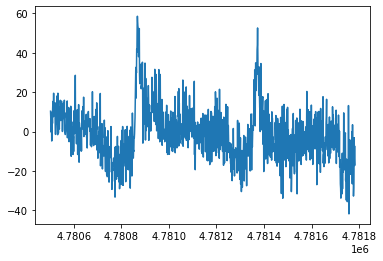

In [71]:
mask = (df['pilot']=='p801') & (df['experiment']=='SS')
sample_signal = df[mask]['eeg_f8'].iloc[3840:5120]
plt.plot(sample_signal)

#### Discrete Wave Transform
Like how we did with our ECG, we can similar apply denoising on our EEG signals through the Discrete Wavelet Transform.

([<matplotlib.lines.Line2D at 0x1f0b67bd790>], Text(0.5, 1.0, 'Denoised'))

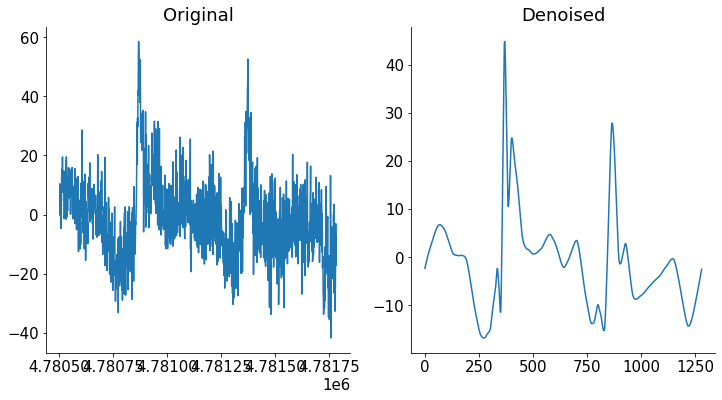

In [22]:
new_signal = wavelet_denoising(sample_signal, wavelet='sym6', level=5)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
ax1.plot(sample_signal), ax1.set_title('Original'),
ax2.plot(new_signal), ax2.set_title('Denoised')

The result of this denoising technique is more apparent here than with our ECG signal. Here we see that significant portion of our fuzziness has been removed. These typically correspond to high frequency contaminants due to the less than ideal recording conditions in the experiment.


This is a good time to explain how the denoising really works. The Discrete Waveform Transform is a method of taking a time-series signal, and extracting time-frequency features from it. How this occurs is that a wavelet is passed through the entire length of a signal, breaking it down. This is a wavelet.

<img src="./images/sym_wavelet.png" style="width: 500px;"/>

By passing this wavelet through our target signal, we are able to break down this signal to any number of levels, subject to some maximum level based on our signal. At each level of decomposition we break our target signal into high and low frequency components, and we get back two types of coefficients - approximate and detailed coefficients. These coefficients reflect the correlation between the original signal and the wavelet function at each point in time, so in essence this allows us to capture both time and frequency information. Each set of approximate coefficients corresponds to the lower range of frequencies, while the detailed coefficients correspond to the higher frequencies. At each further level of decomposition, the *approximate* coefficients are further decomposed into another set of approximate and detailed coefficients. This [visualization](https://www.frontiersin.org/articles/10.3389/fncom.2017.00103/full#F4) shows this process.




<img src="./images/dwt_decomposition.jpg" style="width: 500px;"/>


***

Our denoising function utilises this transformation to extract out these coefficients, then passes them through a thresholding function that removes noise, then subsequently *rebuilds* the signal to obtain what we saw above. But if we wanted to, we could also simply apply just the decomposition step to extract out these detailed and approximate coefficients. As an example, let's decompose the original signal to 5 levels, and extract the 5th level of coefficients. One way to understand this 5th level of coefficients is that it contains the *lowest* level of frequencies, and therefore they constitute the bulk of the original signal. We'll plot both the coefficients returned to us as well as the output of the signal reconstructed from the lowest level of coefficients.

For this demonstration, I am going to take the lead from several papers I've read and use the sym6 wavelet together with 5 levels of decomposition for feature extraction. 

(<StemContainer object of 3 artists>, Text(0.5, 1.0, 'cA5 coefficients'))

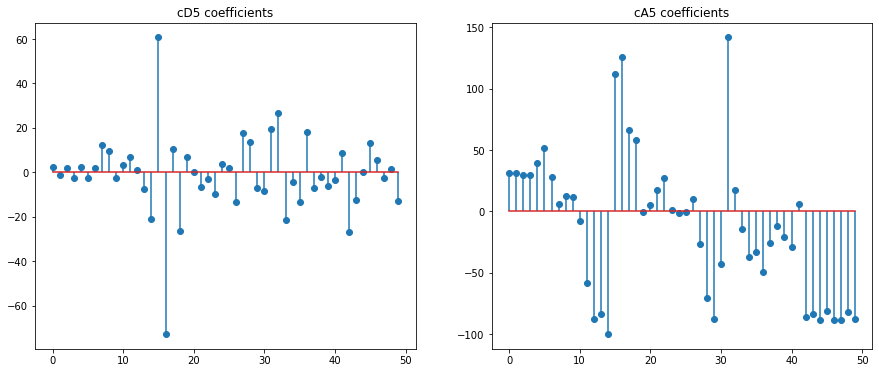

In [72]:
wname = 'sym6'
level=5
cA5, cD5, cD4, cD3, cD2, cD1 = pywt.wavedec(sample_signal, 'sym6', level=5)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))
ax1.stem(np.arange(len(cD5)), cD5), ax1.set_title('cD5 coefficients')
ax2.stem(np.arange(len(cA5)), cA5), ax2.set_title('cA5 coefficients')

([<matplotlib.lines.Line2D at 0x1f0b6bfcd00>],
 Text(0.5, 1.0, 'cA5 coefficients reconstructed signal'))

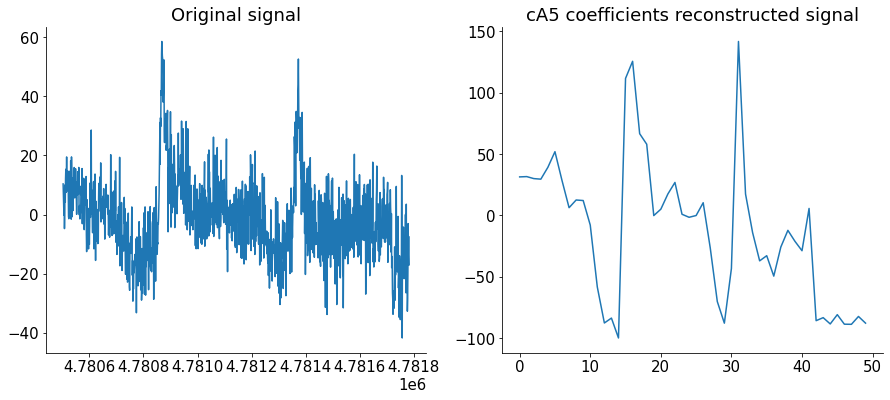

In [25]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,6))
ax1.plot(sample_signal), ax1.set_title('Original signal')
ax2.plot(pywt.waverec([cA5], 'sym6', mode='per')), ax2.set_title('cA5 coefficients reconstructed signal')

We can see that the lowest level of decomposed coefficients are able to already return us a decent representation of the original signal, showing that the majority of the signal's energy can be found at these low frequencies. Consequently, this is why many papers, like the one linked above, use these detailed and approximate coefficients as a method of feature extraction for EEG signals.

[This paper by H. Amin](https://www.frontiersin.org/articles/10.3389/fncom.2017.00103/full#F4) proposes a feature extraction method using these coefficients by calculating the relative and total sub-band energy from the coefficients through this formula.

$$E_{Di} = \sum_{j=1}^{N} \lvert D_{ij}\rvert^2, i = 1,2,3...l$$

where D is the detailed coefficient array, i is the level of composition, and j is the coefficient within the array. Let's try calculating the energy for the cA5 and cD5 coefficients for the signal above.

In [ ]:
def subband_energy(coef_band):
    return np.sum(abs(coef_band)**2)

In [28]:
coef_dict = {'cA5': cA5,
             'cD5': cD5,
             'cD4': cD4,
             'cD3': cD3,
             'cD2': cD2,
             'cD1': cD1}
for k, v in coef_dict.items():
    print('Relative sub-band energy for {} coefs: {}'.format(k, subband_energy(v)))

Relative sub-band energy for cA5 coefs: 175729.90266278552
Relative sub-band energy for cD5 coefs: 15124.67153825197
Relative sub-band energy for cD4 coefs: 11175.252537582022
Relative sub-band energy for cD3 coefs: 11893.214193498265
Relative sub-band energy for cD2 coefs: 21298.46560888516
Relative sub-band energy for cD1 coefs: 44464.80308907413


We've successfully managed to engineer a new feature from our signal that we can now feed into a machine learning model. 

***

The one caveat with using DWT to denoise a signal is that the selection of the type of wavelet and the level of decomposition to use must be carefully chosen for the data one is working with. While the above example demonstrates the functionality of denoising, in truth I do not actually know which wavelet and decomposition level is appropriate for this data. The diagram above shows the different wavelets belonging to the sym wavelet family, but there are many more such wavelet families out there, such as Daubechies, Mohr etc. Unless one is intimately familiar with the behaviour and characteristics of each type of wavelet, it is actually very difficult to choose the appropriate wavelet to perform denoising with. As such, for now I will opt to leave our signal as is, meaning with the noise included, as I intend to only use the low-frequency components to calculate the energies for later. As such I will naturally already be ignoring the noisy frequencies during feature extraction.

### GSR
Exploring galvanic skin response aka electrodermal activity.

GSR is a measure of how conductive someone's skin is. Essentially, the reasoning goes that skin conductivity is [linked to the state of a person's sweat glands](https://www.brainsigns.com/en/science/s2/technologies/gsr). These sweat glands are controlled by the Autonomic Nervous System, specially the Sympathetic Nervous System part of it. This system also controls the emotional behavioural regulation in humans, thus GSR can be thought to be a proxy for measuring emotional arousal. Additionally, GSR has also been linked to mental arousal, which explains why the researchers included this feature in their experiment. 

Some problems that GSR as a feature faces is that GSR readings are easily influenced by external factors such as heat and humidity. Furthermore, different parts of the body will produce different GSR readings. [GSR readings also have a slow response to a given event](https://www.tobiipro.com/learn-and-support/learn/GSR-essentials/response-time-of-gsr-changes/), meaning that any change in response could come seconds after the event onset, which makes correlating GSR with our target events difficult. Even if we chose to lag our GSR signal, we do not have any way of knowing how much to lag by, and furthermore, different people's autonomic nervous system could take different amounts of time to respond to any given event. This is unlike EEG readings, where a change in response can be detected as soon as 50ms after event onset.

All in all, given that one of our minority events, DA, last about 5 seconds, it might be hard to properly correlate GSR with the event.

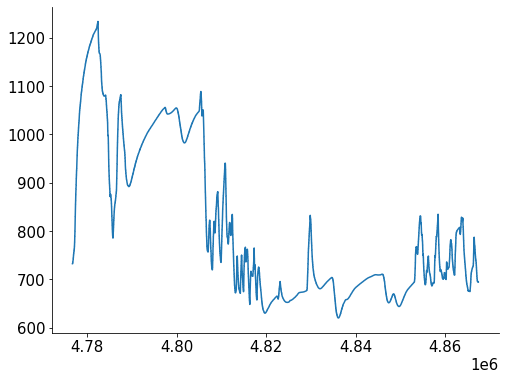

In [46]:
plt.plot(df[mask]['gsr'])

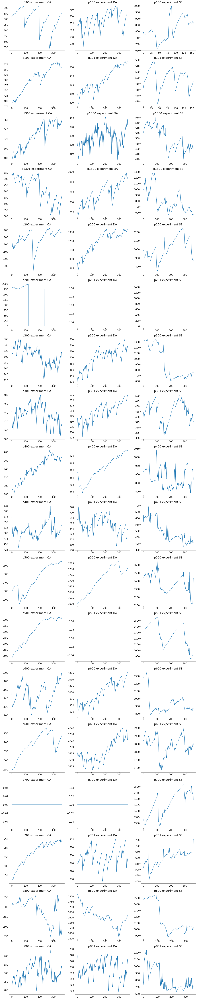

In [47]:
plot_feature_all('gsr')

We notice that there is quite a lot of missing GSR readings in our data. P700 is missing readings for 2 of his experiments, p201's readings are also mostly 0 for all 3 of his experiments, annd p500's DA experiment is also missing the data. Given the large number of MAR data we have for GSR, we shall not be using this feature.

### Respiration


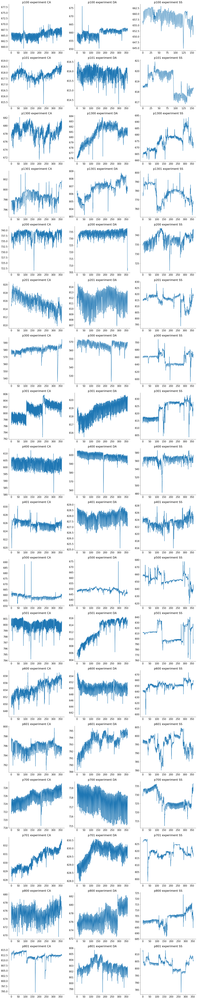

In [48]:
plot_feature_all('r')

Like with ECG, Neurokit comes with a signal cleaning function for respiration signals.

In [36]:
nk.rsp_clean(df[mask]['r'])

array([11.91294724, 20.37169437, 28.77188203, ..., 20.48624691,
       12.11332264,  3.68278903])

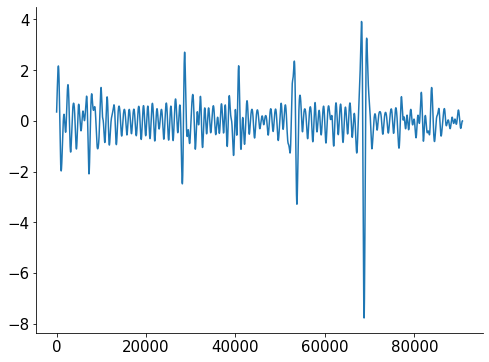

In [33]:
plt.plot(nk.rsp_clean(df[mask]['r'], sampling_rate=256, method='biosppy'))

In [17]:
for pilot in df['pilot'].unique():
    for exp in df['experiment'].unique():
        try:
            mask = (df['pilot']==pilot) & (df['experiment']==exp)
            clean_signal = nk.rsp_clean(df[mask]['r'], sampling_rate=256, method='biosppy')
#             print(data[['ECG_Clean']].head())
            print('Extracted clean signal for {} {}'.format(pilot, exp))            
            df.loc[mask,'r_clean'] = clean_signal

            print('Successfully extracted RSP data for {} {}'.format(pilot, exp))
            print('----------')
        except:
            print('Error with processing RSP data for {} {}'.format(pilot, exp))
            print('----------')

Extracted clean signal for p100 CA
Successfully extracted RSP data for p100 CA
----------
Extracted clean signal for p100 DA
Successfully extracted RSP data for p100 DA
----------
Extracted clean signal for p100 SS
Successfully extracted RSP data for p100 SS
----------
Extracted clean signal for p101 CA
Successfully extracted RSP data for p101 CA
----------
Extracted clean signal for p101 DA
Successfully extracted RSP data for p101 DA
----------
Extracted clean signal for p101 SS
Successfully extracted RSP data for p101 SS
----------
Extracted clean signal for p1300 CA
Successfully extracted RSP data for p1300 CA
----------
Extracted clean signal for p1300 DA
Successfully extracted RSP data for p1300 DA
----------
Extracted clean signal for p1300 SS
Successfully extracted RSP data for p1300 SS
----------
Extracted clean signal for p1301 CA
Successfully extracted RSP data for p1301 CA
----------
Extracted clean signal for p1301 DA
Successfully extracted RSP data for p1301 DA
----------


Like above, let's look at a snapshot of this cleaned respiration signal for each experiment. Because our respiration rate is typically between 12-20 breaths per minute, we can't really tell much from a short 5 second snapshot, so we will look at a 15 second sample instead.

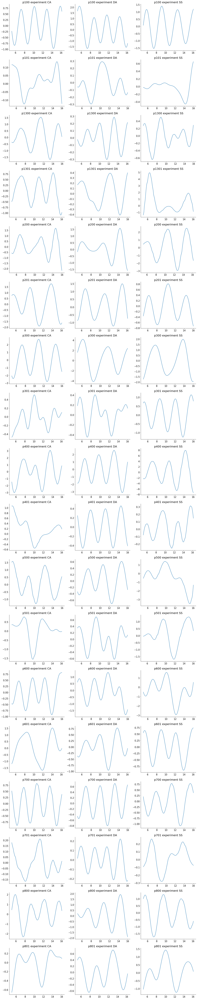

In [42]:
plot_feature_all('r_clean', start=1280, end=256*16)

Let's extract respiratory rate for each signal

In [52]:
display(df[mask]['r_clean'].shape)
len(nk.rsp_rate(df[mask]['r_clean'], sampling_rate=256, peak_method='biosppy'))

(90758,)

90758

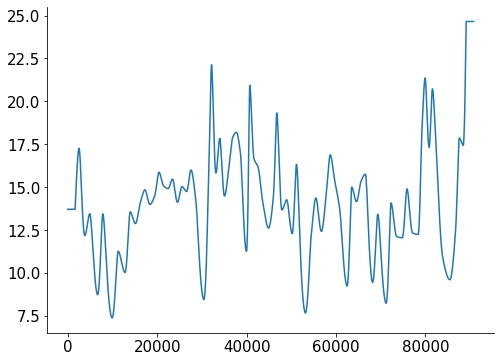

In [48]:
# test run of nk2's rsp_rate function
plt.plot(nk.rsp_rate(df[mask]['r_clean'], sampling_rate=256, peak_method='biosppy'))

In [18]:
for pilot in df['pilot'].unique():
    for exp in df['experiment'].unique():
        try:
            mask = (df['pilot']==pilot) & (df['experiment']==exp)
            rsp_rate = nk.rsp_rate(df[mask]['r_clean'], sampling_rate=256, peak_method='biosppy')
#             print(data[['ECG_Clean']].head())
            print('Extracted clean signal for {} {}'.format(pilot, exp))            
            df.loc[mask,'rsp_rate'] = rsp_rate

            print('Successfully extracted RSP data for {} {}'.format(pilot, exp))
            print('----------')
        except:
            print('Error with processing RSP data for {} {}'.format(pilot, exp))
            print('----------')

Extracted clean signal for p100 CA
Successfully extracted RSP data for p100 CA
----------
Extracted clean signal for p100 DA
Successfully extracted RSP data for p100 DA
----------
Extracted clean signal for p100 SS
Successfully extracted RSP data for p100 SS
----------
Extracted clean signal for p101 CA
Successfully extracted RSP data for p101 CA
----------
Extracted clean signal for p101 DA
Successfully extracted RSP data for p101 DA
----------
Extracted clean signal for p101 SS
Successfully extracted RSP data for p101 SS
----------
Extracted clean signal for p1300 CA
Successfully extracted RSP data for p1300 CA
----------
Extracted clean signal for p1300 DA
Successfully extracted RSP data for p1300 DA
----------
Extracted clean signal for p1300 SS
Successfully extracted RSP data for p1300 SS
----------
Extracted clean signal for p1301 CA
Successfully extracted RSP data for p1301 CA
----------
Extracted clean signal for p1301 DA
Successfully extracted RSP data for p1301 DA
----------


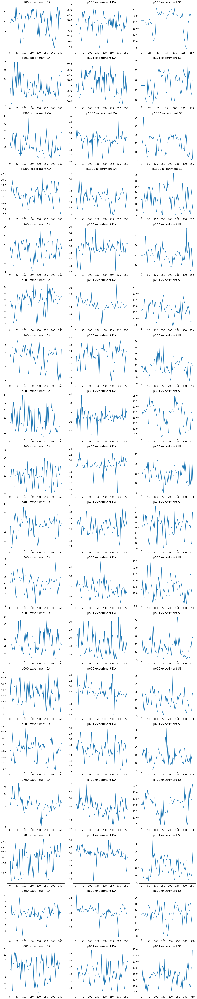

In [55]:
plot_feature_all('rsp_rate')

Unlike the ECG and GSR data, our respiration signal data is at the very least complete with no missing data. The plots of respiration rate show quite a a lot of variability throughout each experiment. Importantly, we should consider whether it is likely that someone's respiration rate can quickly swing from 20 bpm (breath per minute) to 8 bpm, as we see in p801's CA experiment in the first 20 seconds. Perhaps a better approach would be to take a rolling average for respiration rate, perhaps over a 5 second window.

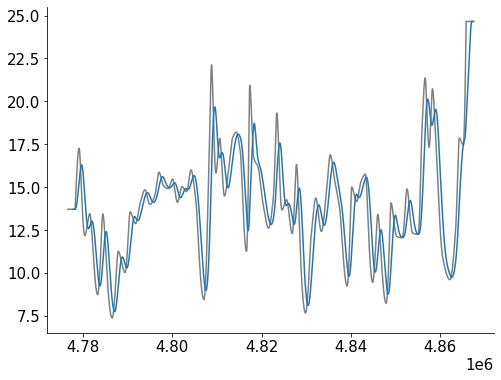

In [61]:
plt.plot(df[mask]['rsp_rate'], c = 'grey')
plt.plot(df[mask]['rsp_rate'].rolling(1280).mean())

A 5 second window doesn't appear to provide that much smoothing. Furthermore, rolling respiration rate this way introduces leakages from a previous segment of signal into the next. Considering that we are going to chunk our signal into 5 second chunks, rolling our respiration rate this way will throw off the true reading for each chunk as part of the signal now comes from another chunk, which isn't what we want especially when comparing 2 chunks of different event types. As such, it doesn't seem like we can use this feature in our model.

We'll save our progress thus far in a pickle file.

In [2]:
import pickle

# pickle.dump(df, open('./data/df_eda_pt1.pickle', 'wb'))

## Feature engineering and exploration

This project aims to explore 2 approaches to working with multivariate time series data for classification purposes. The first is the use of extracted features in more traditional machine learning model such as boosted trees. The second is the use of raw signal vectors fed as inputs to deep learning neural network models. This feature engineering section is focused on preparing our data for the first approach.

Our first approach is going to be feeding into our model a series of scalar features that we extract *per* chunk of signal. Thus our first step now should be to create these chunks. I'll be making the executive decision to drop the first 10s of each experiment from chunking just in case the start of each experiment was not clean, i.e. the participant wasn't properly ready, or sensors weren't ready. Thereafter, we create 5 second chunks of signal that each correspond to one and only one event. This is because we want to learn differences between signals corresponding to different events, and having one chunk of signal be split between 2 events if simply going to make our model learn the wrong things.

In [14]:
chunk_number = 0
for pilot in df['pilot'].unique():
    for exp in df['experiment'].unique():        
        tmp = df[(df['pilot'] == pilot) & (df['experiment'] == exp)]
        idx = tmp.index[2560]
        for i in range(80):
            try:
                # checks whether the chunk contains only 1 unique event
                if len(tmp.loc[idx: idx+1279]['event'].unique())==1:
                    curr_event = tmp.loc[idx: idx+1279]['event'].unique()[0]
                    # if the next chunk contains less than 1280 samples, i.e. we reached the end 
                    if len(df.loc[idx: idx+1279])<1280:
                        continue
                    else:
                        # assigns that 5s chunk of signal with a unique chunk number
                        df.loc[idx: idx+1279,'chunk'] = chunk_number
                        chunk_number += 1
                        idx += 1280
#                     print('current idx is ' + str(idx))
                # if the chunk contains more than 1 unique event, move the start of the chunk to the start of the new event
                elif len(tmp.loc[idx: idx+1279]['event'].unique())!=1:
                    new_event = [event for event in tmp.loc[idx: idx+1279]['event'].unique() if event is not curr_event][0]
#                     print (new_event)
                    idx = tmp.loc[idx: idx+1279][tmp.loc[idx: idx+1279]['event'] == new_event].index[0]
                    continue
            except:
                continue

In [ ]:
# pickle.dump(df, open('./data/df_eda_pt1.pickle', 'wb'))

In [5]:
# with open('./data/df_eda_pt1.pickle', 'rb') as file:
#     df = pickle.load(file)

In [11]:
df.head()

,crew,experiment,time,seat,eeg_fp1,eeg_f7,eeg_f8,eeg_t4,eeg_t6,eeg_t5,...,eeg_o2,ecg,r,gsr,event,pilot,ecg_denoised,chunk,r_clean,rsp_rate
0,1,CA,0.183594,0,1.99310,8.099320,8.89996,-11.851900,0.637441,-5.89253,...,-1.820250,-18260.80078,665.002014,823.356018,A,p100,7.465958,NaN,0.464012,19.800193
1,1,CA,0.187500,0,1.44216,7.208550,6.15352,-18.372601,7.036370,-2.30195,...,-0.210154,-18260.80078,665.002014,823.356018,A,p100,9.230812,NaN,0.468082,19.800193
2,1,CA,0.191406,0,1.88180,1.906450,-7.29714,0.054378,9.325300,-10.38720,...,-8.399230,-18260.80078,665.002014,823.356018,A,p100,9.259789,NaN,0.472148,19.800193
3,1,CA,0.195312,0,3.10060,0.000000,8.11878,10.091100,4.783260,-14.55340,...,-11.997400,-18260.80078,665.002014,823.356018,A,p100,8.188631,NaN,0.476209,19.800193
4,1,CA,0.199219,0,0.00000,-0.260347,5.00783,10.015900,-1.802200,-7.04979,...,-9.385510,-18260.80078,665.002014,823.356018,A,p100,8.019081,NaN,0.480264,19.800193


In [66]:
# seeing if our chunking worked
df.groupby('chunk')['rsp_rate'].describe()

,count,mean,std,min,25%,50%,75%,max
chunk,,,,,,,,
0.0,1280.0,21.324723,3.834402e-01,20.495369,21.005062,21.374689,21.686554,21.818182
1.0,1280.0,20.684692,3.682328e-01,20.317460,20.379034,20.556307,20.882514,21.652661
2.0,1280.0,21.178540,8.199600e-01,20.078431,20.217280,21.333860,21.991031,22.196532
3.0,1280.0,21.397301,6.666392e-01,20.221600,20.820553,21.415885,22.047059,22.293179
4.0,1280.0,22.803270,9.093950e-01,22.132565,22.182647,22.271738,23.274709,25.155013
...,...,...,...,...,...,...,...,...
3527.0,1280.0,9.896687,2.580961e-01,9.600000,9.659193,9.831727,10.101383,10.453307
3528.0,1280.0,10.681347,9.019166e-01,9.600297,9.844608,10.479465,11.423008,12.555104
3529.0,1280.0,16.242153,1.810677e+00,12.559410,14.643661,17.261964,17.770977,17.860465


Using the tsfresh library, we are able to extract features for any given signal using their very comprehensive set of functions. Some basic features we are able to extract are the mean, variance, kurtosis and skew of a signal. Another useful feature that tsfresh can help us extract is the absolute energy of signal. We'll create a separate table to hold the results of these aggregate functions.

In [67]:
agg_table = pd.DataFrame()

In [68]:
eeg_cols = df.columns[df.columns.str.contains('eeg')]
for col in eeg_cols:
    for func in ['variance', 'mean','skewness','kurtosis','abs_energy']:
        agg_table[col+'_'+func] = df.groupby('chunk')[col].apply(getattr(feature_calculators, func))
        
agg_table

,eeg_fp1_variance,eeg_fp1_mean,eeg_fp1_skewness,eeg_fp1_kurtosis,eeg_fp1_abs_energy,eeg_f7_variance,eeg_f7_mean,eeg_f7_skewness,eeg_f7_kurtosis,eeg_f7_abs_energy,...,eeg_cz_variance,eeg_cz_mean,eeg_cz_skewness,eeg_cz_kurtosis,eeg_cz_abs_energy,eeg_o2_variance,eeg_o2_mean,eeg_o2_skewness,eeg_o2_kurtosis,eeg_o2_abs_energy
chunk,,,,,,,,,,,,,,,,,,,,,
0.0,536.262427,-1.629910,-1.030400,2.685942,6.898164e+05,86.292108,-0.457109,-0.272935,0.256866,110721.352297,...,188.066447,0.096975,0.077430,1.091010,240737.089155,99.035336,-0.105698,0.393957,0.350697,126779.530292
1.0,1441.391024,1.666653,0.091707,0.356019,1.848536e+06,119.740835,0.407402,0.194576,0.510444,153480.717967,...,199.029396,0.153983,-0.223950,0.034878,254787.976486,116.536754,1.264533,-0.027433,-0.236646,151213.820725
2.0,268.009911,-0.224897,0.404622,0.158087,3.431174e+05,84.413973,-0.112212,0.004205,0.066054,108066.002568,...,130.493602,-0.860569,0.348006,0.444924,167979.750918,66.576341,-0.857615,-0.045231,0.389221,86159.159667
3.0,132.411011,-0.312152,0.114657,0.805623,1.696108e+05,87.486334,0.407035,0.053012,0.002013,112194.575533,...,139.256486,-1.272481,-0.230303,0.011241,180320.888132,71.956582,0.506151,-0.049192,-0.320652,92432.346525
4.0,538.814936,-4.168226,-1.699561,3.715753,7.119220e+05,116.336753,-0.410986,-0.028529,-0.015221,149127.247963,...,193.176298,-0.007157,-0.020633,0.344633,247265.726476,70.653886,0.084062,-0.107194,0.008715,90446.019510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3527.0,88.719879,-1.460203,-0.727657,1.109143,1.162907e+05,70.169624,-0.319277,-0.443073,0.782844,89947.599153,...,55.912288,1.021939,-0.251619,-0.038597,72904.508005,52.102273,0.751637,0.104641,0.117238,67414.056305
3528.0,542.715765,8.840624,2.790261,12.550842,7.947167e+05,452.516406,5.743849,2.433574,8.753723,621450.503020,...,112.255831,2.207402,0.208699,0.439653,149924.421258,91.648404,0.447785,0.101389,0.205874,117566.611791
3529.0,1201.659961,4.112933,1.876079,5.892369,1.559778e+06,618.168392,2.506329,1.654695,5.425146,799296.098547,...,93.168474,-1.655262,-0.150830,-0.134903,122762.708123,47.399360,-0.479357,0.275031,0.111024,60965.303053


Here we apply our DWT decomposition technique to extract a series of coefficients out from our signals. From these signals, we can calculate the absolute energy in each band to use as feature. Each level of decomposition splits our frequency band by a factor of 2 based on the sampling frequency, thus the first level of coefficients, D1 would correspond to 128-256 Hz, while D2 would correspond to 64-128 Hz. [Frequencies above 60 Hz are typically considered to be noise](https://www.frontiersin.org/articles/10.3389/fncom.2017.00103/full#F4) so we will disregard the first 2 levels of coefficients, and only use D3, D4, D5, and A5 to extract energy features.

Here, following the lead of existing literature, we will use the sym6 wavelet and 5 levels of decomposition to extract coefficients out from our EEG signal. These are parameters that have been used specifically for EEG data in the past, so for the sake of engineering these features, we shall follow those parameters.

In [81]:
def energy_aggregator(x, level=5):
    cA5, cD5, cD4, cD3, cD2, cD1 = pywt.wavedec(x, 'sym6', level=level)
    ca5_energy = subband_energy(cA5)
    cd5_energy = subband_energy(cD5)
    cd4_energy = subband_energy(cD4)
    cd3_energy = subband_energy(cD3)
    
    return ca5_energy, cd5_energy, cd4_energy, cd3_energy

In [82]:
for col in eeg_cols:
    energy_sum = df.groupby('chunk')[col].apply(energy_aggregator).to_numpy()
    ca5, cd5, cd4, cd3 = list(zip(*energy_sum))
    agg_table[col+'_'+'ca5'] = ca5
    agg_table[col+'_'+'cd5'] = cd5
    agg_table[col+'_'+'cd4'] = cd4
    agg_table[col+'_'+'cd3'] = cd3

Finally, we need to assign each chunk back its corresponding event.

In [103]:
agg_table['event'].value_counts(normalize=True)

A    0.571914
C    0.357588
D    0.045583
B    0.024915
Name: event, dtype: float64

In [93]:
agg_table['event'] = df.groupby('chunk')['event'].unique().map(lambda x: x[0])

In [153]:
agg_table.to_csv('./data/agg_table.csv', index=False)

In [34]:
# agg_table = pd.read_csv('./data/agg_table.csv')

Let's explore our newfound features

Due to the imbalance of our classes, it is hard to observe the minority classes in a histogram as they are buried underneath our majority classes here. We'll use a boxplot instead to observe a few channels and see if there are visual indications of differences.

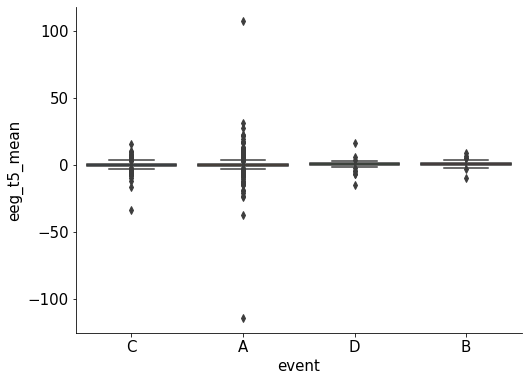

In [116]:
sns.boxplot(data=agg_table, x = 'event', y = 'eeg_t5_mean');

Due to some very extreme outliers, our IQR becomes extremely squashed. We'll plot some more boxplots, but this time setting showfliers to false to better observe the IQR.

### Mean

In [145]:
def plot_eeg_features(feature, fliers=False):
    fig, ax = plt.subplots(5,4, figsize=(20,20))
    ax = ax.ravel()
    for n, col in enumerate(agg_table.columns[agg_table.columns.str.contains(feature)]):
        sns.boxplot(data=agg_table, x = 'event', y = col, showfliers=fliers, ax=ax[n], order = ['A','B','C','D']);
    fig.suptitle('{} for EEG channels'.format(feature))
    plt.tight_layout()

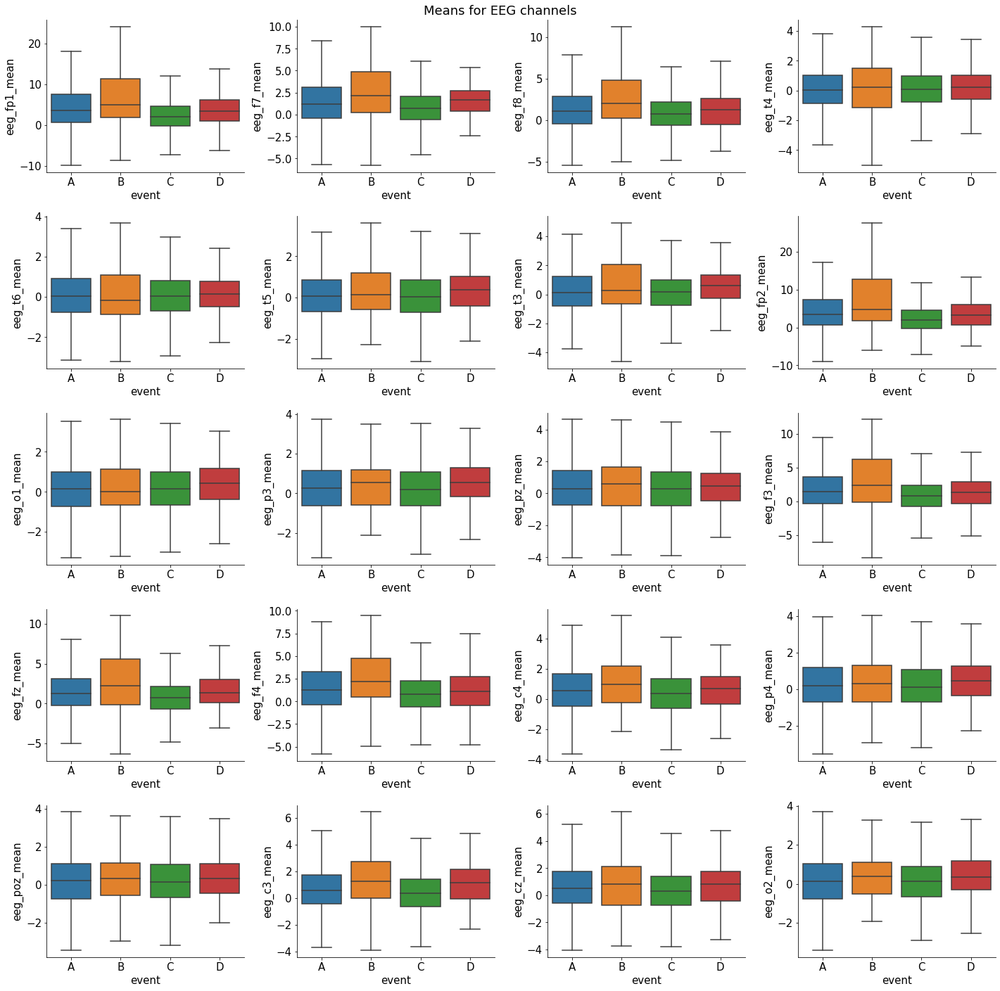

In [144]:
plot_eeg_features('mean')

While not exactly very clear, it does appear than on average, the means of the signals recorded by our 20 EEG channels are very *slightly* higher when the event is Surprise/Startled (B). Furthermore, for quite a few channels, the IQR for event B also appears to be larger than other events as well. As for event D, it's less clear whether there are any differences. All in all, it's quite hard to discern any patterns here for our minority events.

### Variance

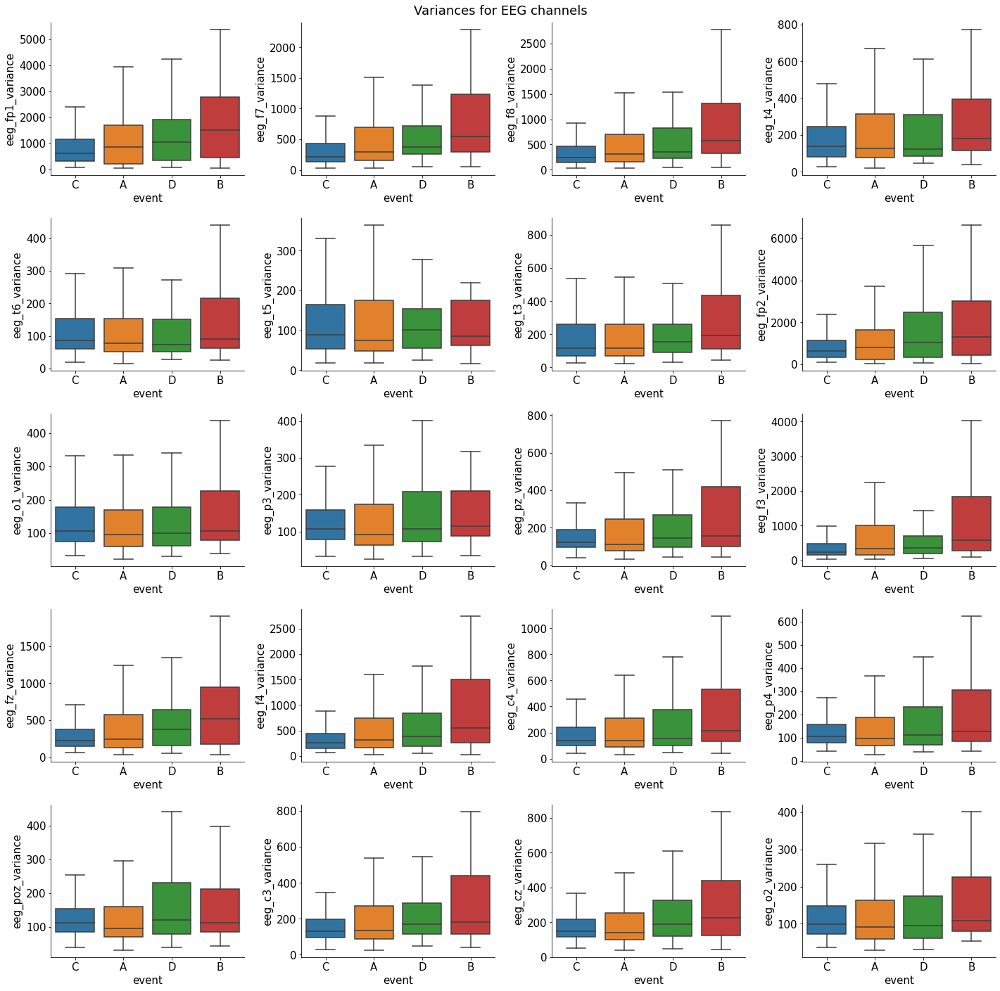

In [132]:
fig, ax = plt.subplots(5,4, figsize=(20,20))
ax = ax.ravel()
for n, col in enumerate(agg_table.columns[agg_table.columns.str.contains('var')]):
    sns.boxplot(data=agg_table, x = 'event', y = col, showfliers=False, ax=ax[n])
fig.suptitle('Variances for EEG channels');
plt.tight_layout()

This time, we do see that the variances for signal chunks belonging to event 'B' tend to be higher than for other events, and that the IQR is also larger. It is still quite hard to discern any differences between event D and the 2 majority classes.

### Kurtosis

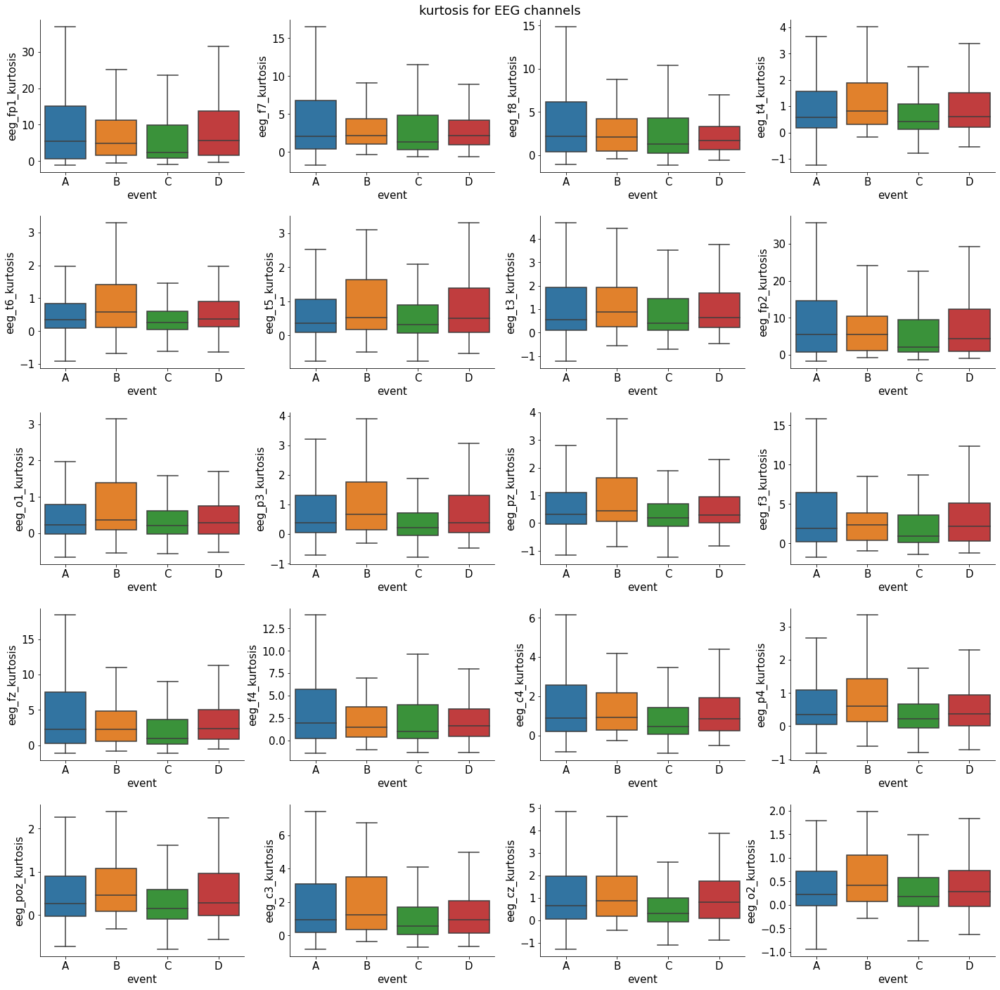

In [146]:
plot_eeg_features('kurtosis')

In this plot, we see that both events B and D have on average higher kurtosis than event C. This difference is less pronounced with events B and D vs event A. Higher kurtosis indicates that the tails for the distribution of these signals differ more from the normal distribution, meaning that there are more extreme values in these distributions. 

There are also quite a lot of channels for which event A has a wider spread for kurtosis.

### Skew

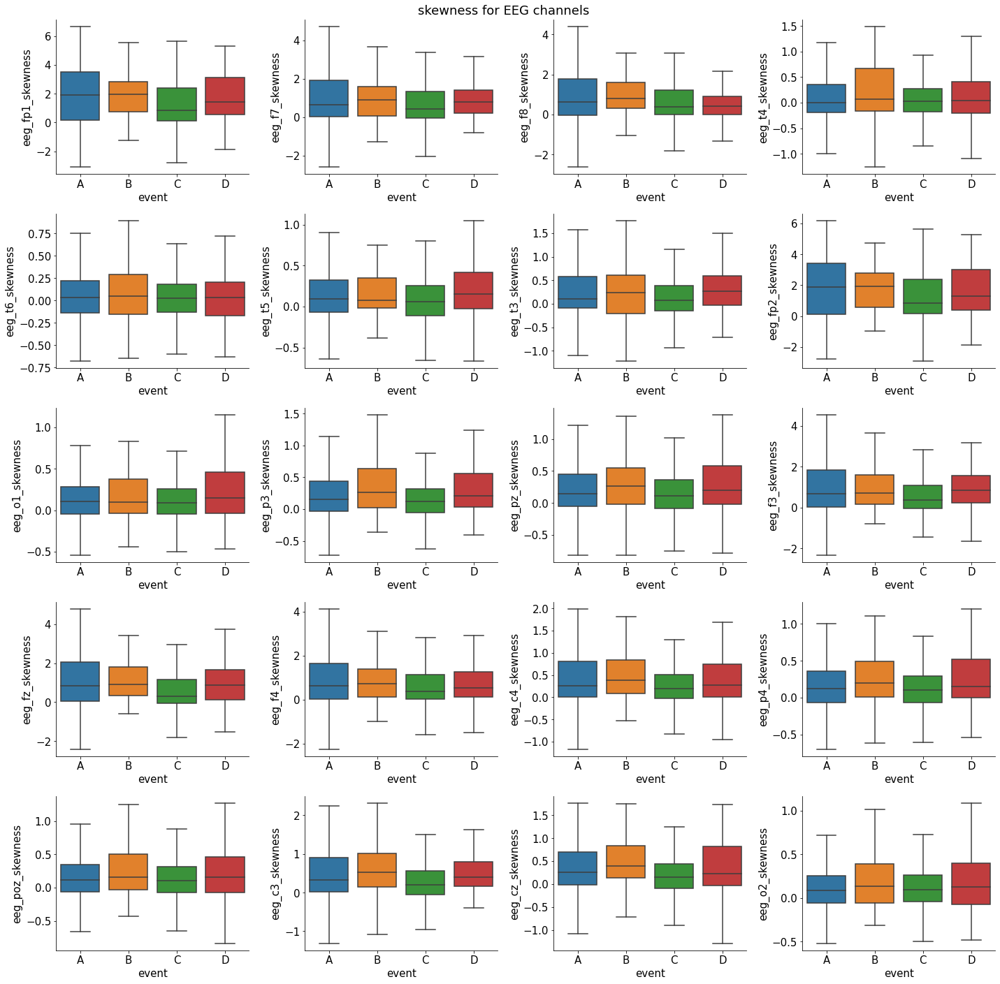

In [147]:
plot_eeg_features('skewness')

We note than the average skew across all channels is positive, indicating more extreme values on the higher end of the distribution. We also note that while the average skew falls between 0 and 1, there are 2 channels that display much higher average skew - electrodes fp1 and fp2. Interestingly, both these electrodes sit at the front most part of the head.

### Absolute energy

In [161]:
agg_table[agg_table.columns[agg_table.columns.str.contains('abs_energy')]].describe().T

,count,mean,std,min,25%,50%,75%,max
eeg_fp1_abs_energy,3532.0,2.581277e+06,1.498654e+07,41125.641162,368229.198696,980961.524257,2.031011e+06,4.500605e+08
eeg_f7_abs_energy,3532.0,1.577738e+06,1.468341e+07,36737.939332,192383.467396,346718.545015,7.970467e+05,4.972784e+08
eeg_f8_abs_energy,3532.0,1.634795e+06,1.583997e+07,39822.252474,205763.867835,376999.505722,8.147481e+05,5.106334e+08
eeg_t4_abs_energy,3532.0,7.737050e+05,8.499703e+06,25613.267699,101654.799622,172559.406984,3.663761e+05,3.516326e+08
eeg_t6_abs_energy,3532.0,4.063224e+05,3.175741e+06,19391.915385,71641.992960,105978.495840,2.007793e+05,1.635159e+08
eeg_t5_abs_energy,3532.0,4.316794e+05,4.175419e+06,21361.472449,66162.366068,106142.443080,2.204809e+05,1.696884e+08
eeg_t3_abs_energy,3532.0,8.412752e+05,7.604633e+06,27783.900761,92184.260391,154969.830802,3.482499e+05,2.280544e+08
eeg_fp2_abs_energy,3532.0,2.705647e+06,1.620985e+07,38757.586286,386756.368582,951696.665585,2.008691e+06,4.251346e+08
eeg_o1_abs_energy,3532.0,1.046224e+06,1.685281e+07,28492.022345,86092.232725,131003.102181,2.293849e+05,7.445427e+08
eeg_p3_abs_energy,3532.0,3.465901e+05,3.123364e+06,31728.341695,91501.319898,129777.346610,2.198165e+05,1.719052e+08


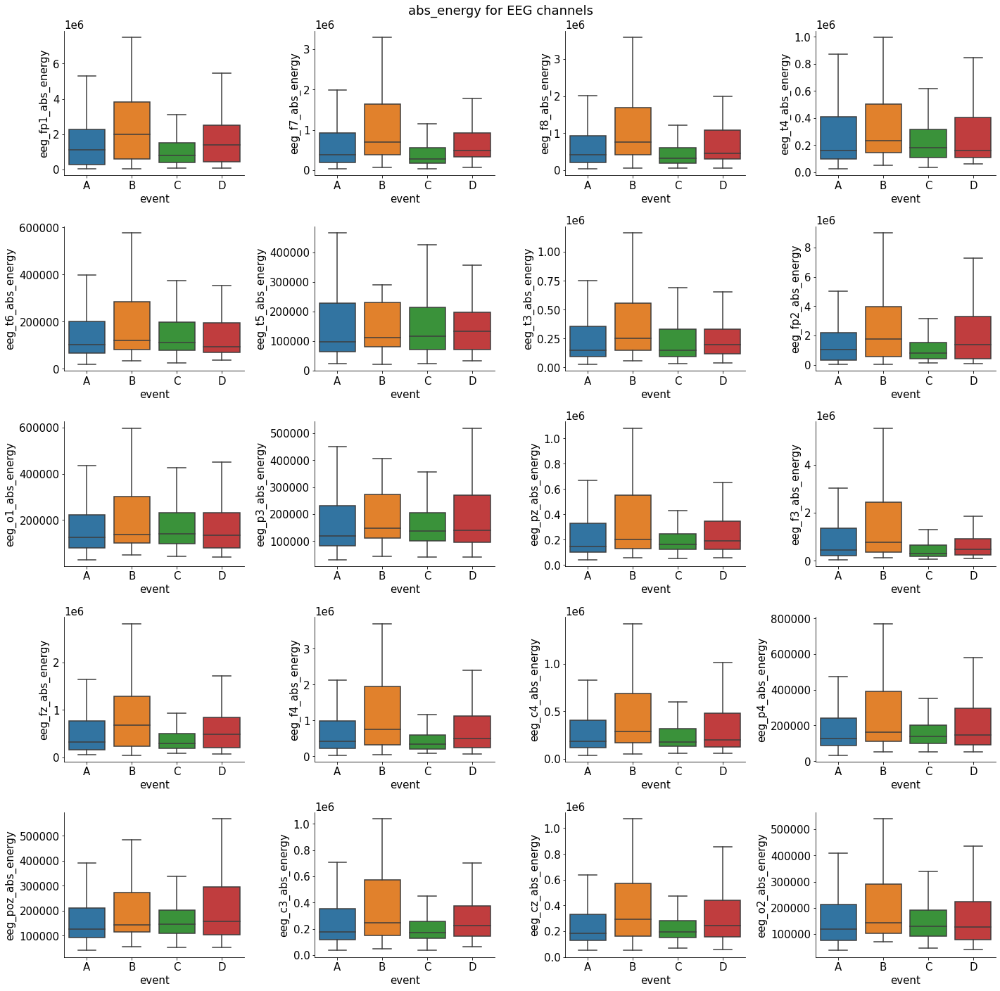

In [148]:
plot_eeg_features('abs_energy')

### A5 band energy

From here we begin exploring the features we obtained by decomposing our signal using DWT.
The A5 band contains the lowest frequencies obtained from our signal, from 0-8 Hz.

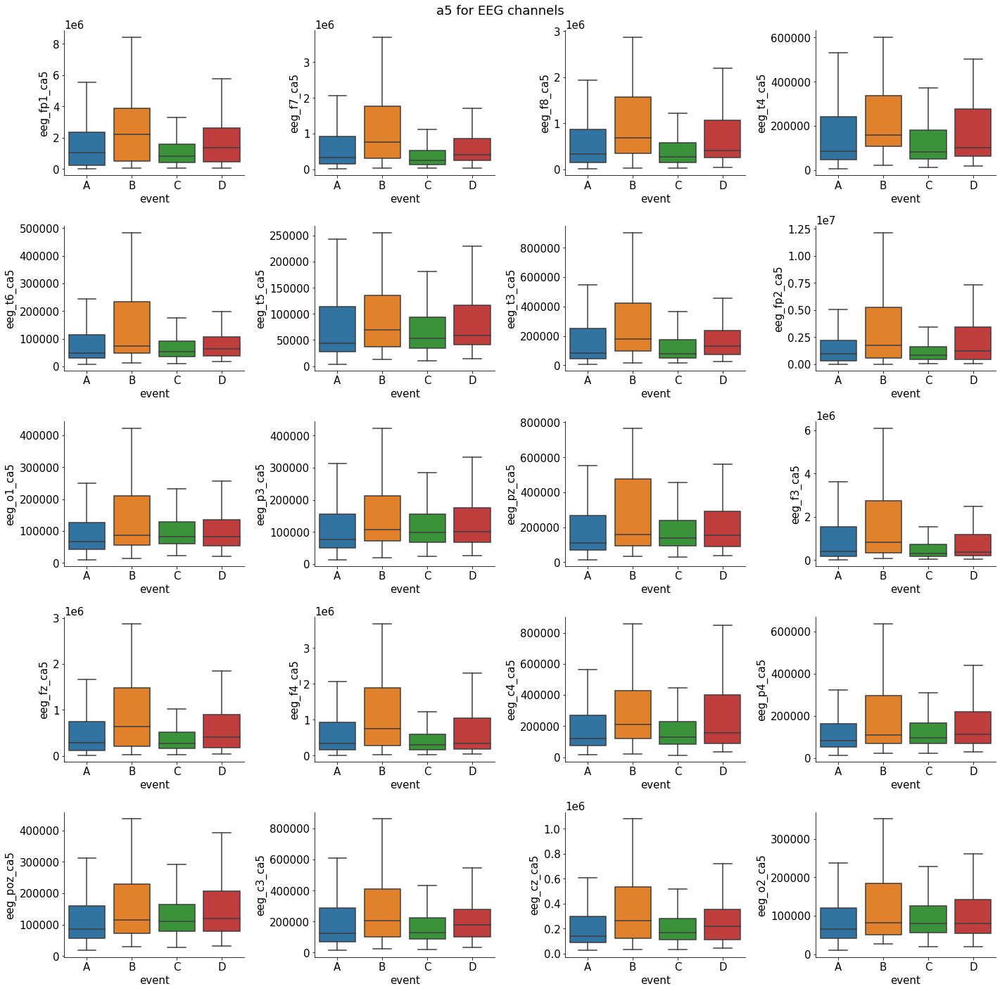

In [149]:
plot_eeg_features('a5')

event
A    114636.185488
B    191692.506505
C    129764.009077
D    156673.746219
dtype: float64

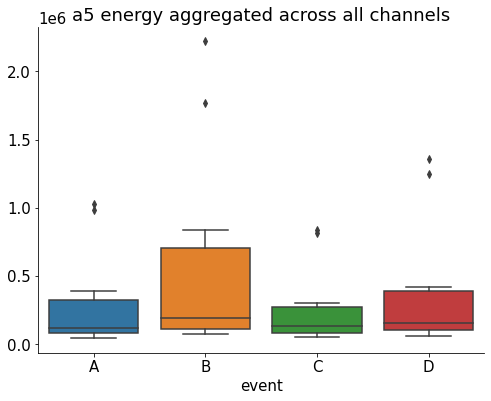

In [39]:
mask = list(agg_table.columns[agg_table.columns.str.contains('ca5')]) + ['event']
sns.boxplot(data = agg_table[mask].groupby('event').agg(np.median).T)
plt.title('a5 energy aggregated across all channels');
agg_table[mask].groupby('event').agg(np.median).apply(np.median, axis=1)

Between each EEG channel, there is quite a lot of variation in the absolute energy for the A5 band. There are also quite a few channels for which the energy present in the signal for events B and D is higher than the energy present for events A and C,  at the A5 band level. We see this more clearly when we aggregate all 20 channels together and compare the energy for each different event.

### D5 band energy
The D5 coefficients correspond to the frequency band of 8-16 Hz

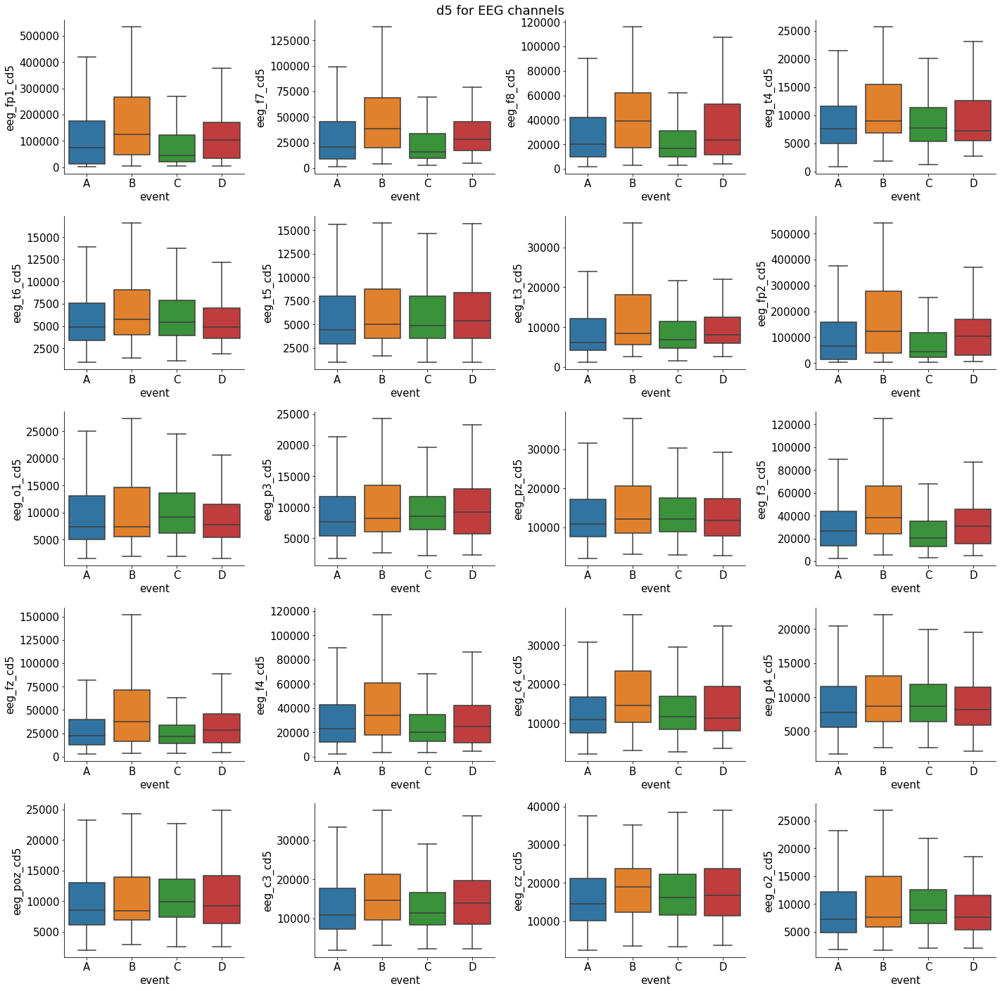

In [150]:
plot_eeg_features('d5')

event
A    10795.762659
B    13320.532413
C    11558.528316
D    11595.908107
dtype: float64

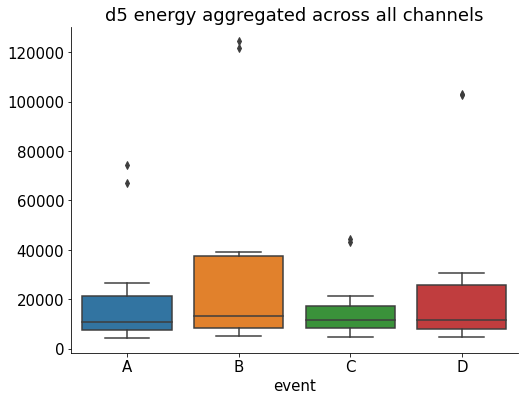

In [40]:
mask = list(agg_table.columns[agg_table.columns.str.contains('cd5')]) + ['event']
sns.boxplot(data = agg_table[mask].groupby('event').agg(np.median).T)
plt.title('d5 energy aggregated across all channels');
agg_table[mask].groupby('event').agg(np.median).apply(np.median, axis=1)

For the majority of EEG channels, we see that the average A5 energy for event B tends to be slightly higher than the rest, with the exception of a few electrodes. However, the differences are not very pronounced.

### D4 band energy
The D4 band corresponds to the frequency band of 16-32 Hz

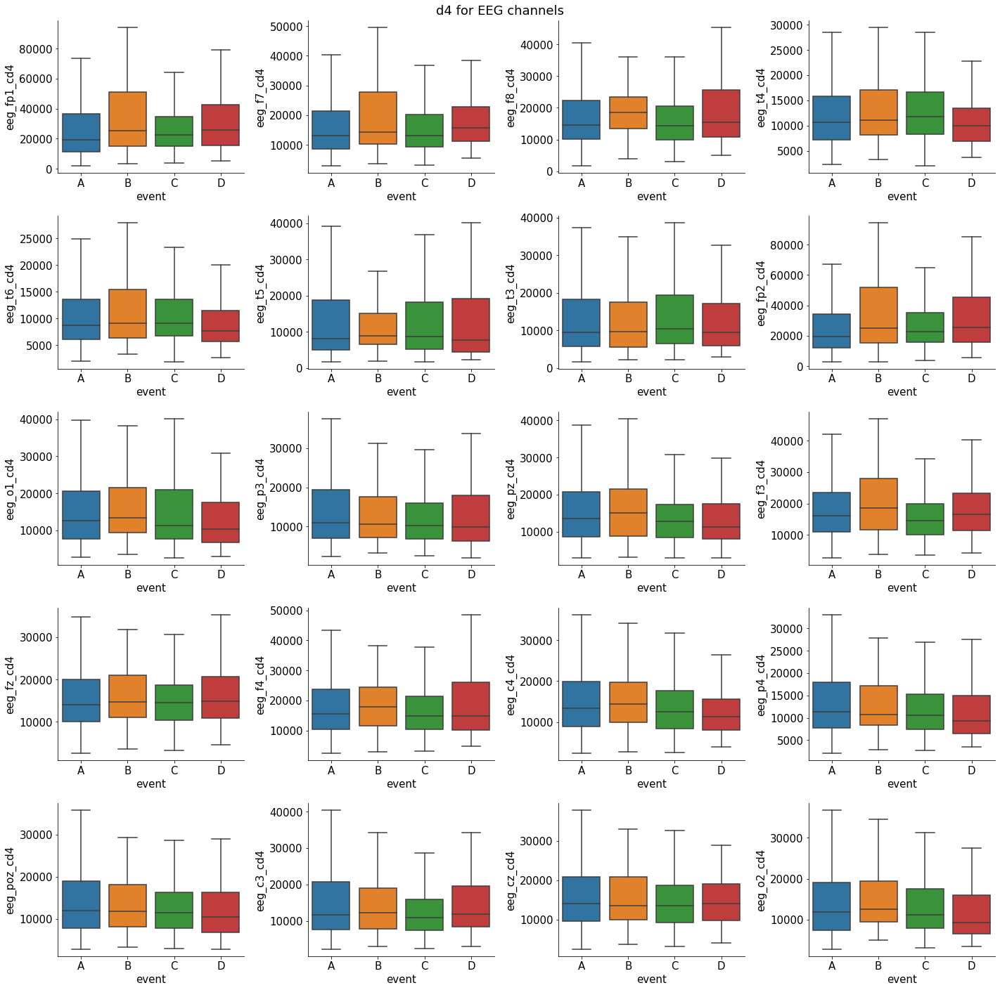

In [152]:
plot_eeg_features('d4')

event
A    12873.255359
B    13481.061107
C    12171.450064
D    11314.827409
dtype: float64

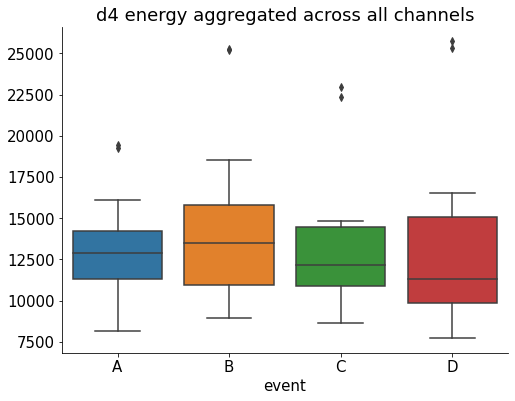

In [38]:
mask = list(agg_table.columns[agg_table.columns.str.contains('cd4')]) + ['event']
sns.boxplot(data = agg_table[mask].groupby('event').agg(np.median).T)
plt.title('d4 energy aggregated across all channels')
agg_table[mask].groupby('event').agg(np.median).apply(np.median, axis=1)

Starting from the D4 band, we notice that there are now more channels for which the energy for event D signals are starting to become lower than the the energy for event A and C signals. These channels are primarily prefixed with 't' or 'c', which refer to temporally and centrally placed electrodes. This indicates that the expression of beta wave activity actually differs throughout the brain, and that there is more beta wave activity in frontally placed electrodes (prefixed with 'f' or 'fp') than the other electrodes.

The average energy for event B signals still appears to be the highest among all the events, while the energy for event D signals has become the lowest of all 4 events for the first time. This indicates that some changes are occuring in this band.

### D3 band energy
The D3 band corresponds to the frequency band of 32-64 Hz.

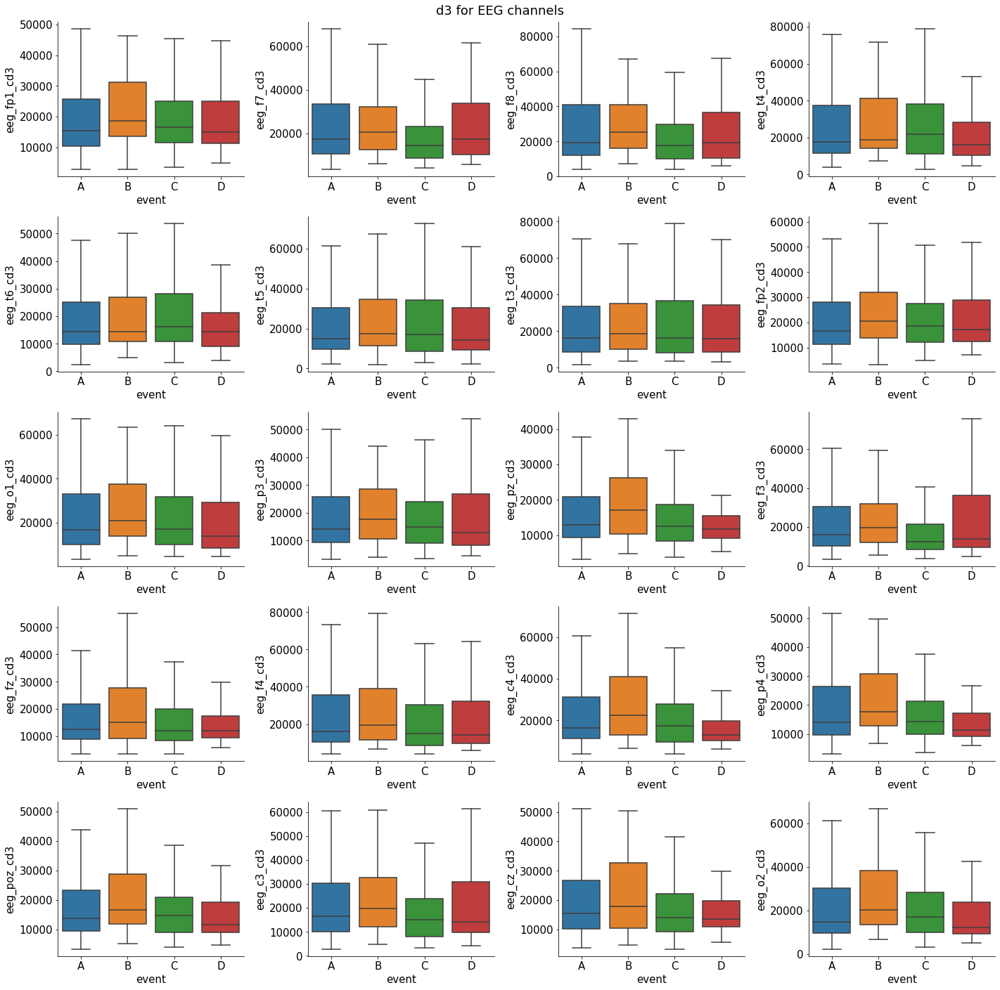

In [151]:
plot_eeg_features('d3')

event
A    15634.228103
B    18645.729884
C    15591.572751
D    13969.903886
dtype: float64

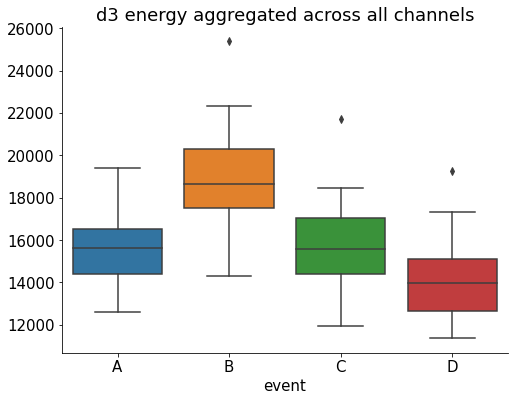

In [35]:
mask = list(agg_table.columns[agg_table.columns.str.contains('cd3')]) + ['event']
sns.boxplot(data = agg_table[mask].groupby('event').agg(np.median).T)
plt.title('d3 energy aggregated across all channels')
agg_table[mask].groupby('event').agg(np.median).apply(np.median, axis=1)

Like above, the energy in event D signals starts to be lower than event A and C for the D3 band. This is the highest frequency band that we're measuring for EEG, which is the frequency band of brain waves associated with more concentration and focused thinking. At the same time we note that the energy for event B is much higher than the other classes. Interestingly, information about novel stimuli, i.e. unexpected stimuli which can lead to surprise, is also propagated by gamma brain waves, [according to this article](https://neurosciencenews.com/brain-wave-surprise-17317/). Thus there are 2 observations to make here. The first is that gamma wave activity in low in event D, where concentration is interrupted by the distraction event. Secondly, gamma wave activity is high in event B, where novel stimuli that triggers surprise is propagated by gamma waves. This band of energy may prove useful in helping our model differentiate between these events

We have a total of 9 unique features per EEG channel, which makes 180 features in all, for our 20 EEG channels.

### Correlation matrix between features

<AxesSubplot:>

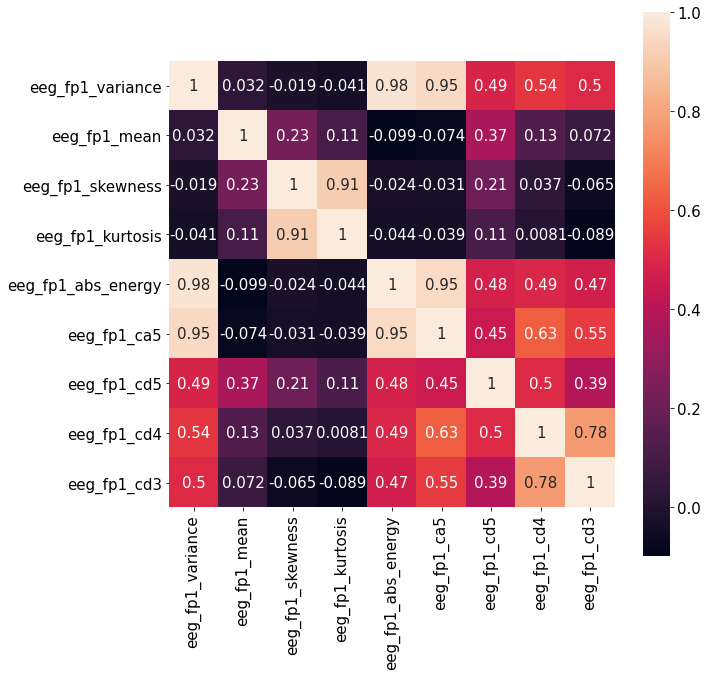

In [174]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(agg_table[agg_table.columns[agg_table.columns.str.contains('eeg_fp1')]].corr(), annot=True, ax=ax, square=True)

There are a few features that seem to have high correlation. For example, absolute energy has high correlation with cA5 energy and variance. The relationship between signal variance and its energy is that the variance describes the de-meaned energy of a signal. This explains the high correlation, however, we do not necessarily know which is more useful for discriminating between our classes. We also note that similar approaches have been done before with EEG data, for example by Boonyakitanont et al. (2019), in their paper [*A review of feature extraction and performance evaluation in
epileptic seizure detection using EEG*](https://arxiv.org/pdf/1908.00492.pdf).

The relationship between absolute energy and cA5 energy is also logical, as the cA5 coefficients correspond to the lowest frequency band of a signal, which typically carries the most information about that signal. However, being able to feed distinct frequency bands as features to our model will allow our model to learn which frequency band contains the most useful information to discriminate between our classes.

We should ultimately remember that our choice of engineering these specific features is grounded in what we learnt in our literature review. Data science should not be divorced from domain expertise, and in our case of biomedical signal processing, we should follow the lead of biomedical researchers who have successfully used these features in their research. We will of course perform post-hoc analysis to confirm whether our findings align with what we have read.
***
In the next notebook we will begin the modeling process.